In [1]:
pip install lime


Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install wordcloud


Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install tensorflow


In [4]:
pip install pyspark


Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install py4j


Note: you may need to restart the kernel to use updated packages.


In [6]:
 pip install plotly 

Note: you may need to restart the kernel to use updated packages.


In [7]:
!pip install pandas


In [3]:

import pandas as pd
import seaborn as sns
import re, nltk
nltk.download('punkt')
import matplotlib.pyplot as plt 
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from matplotlib import pyplot
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score, accuracy_score
import string
from nltk.corpus import stopwords
nltk.download('stopwords')
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.metrics import f1_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_val_score
import numpy as np
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from lime import lime_tabular
from tensorflow.keras.layers import Embedding
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.layers import LSTM, Bidirectional
from tensorflow.keras.layers import Dense, Dropout
import plotly.graph_objects as go
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\dovle\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\dovle\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [1]:
from pyspark.sql import SparkSession

# 1. Create SparkSession
sparkSession = SparkSession.builder.appName("Big_Data_MongoDB_SQL").getOrCreate()

# 2. Read CSV file into DataFrame
data = sparkSession.read.csv('hdfs://localhost:9000/Dovlet/tw.csv', header=True, inferSchema=True)

# 3. Show the first few rows of the DataFrame
data.show(5)

# 4. Display the column names
data.columns

+------------------+-----------------+----------------------------+--------------+-------------------------+--------------+----------+--------------------+-----------+--------------------+--------------+--------------------+----+
|          tweet_id|airline_sentiment|airline_sentiment_confidence|negativereason|negativereason_confidence|       airline|      name|                text|tweet_coord|       tweet_created|tweet_location|       user_timezone|_c12|
+------------------+-----------------+----------------------------+--------------+-------------------------+--------------+----------+--------------------+-----------+--------------------+--------------+--------------------+----+
|570306133677760513|          neutral|                         1.0|          null|                     null|Virgin America|   cairdin|@VirginAmerica Wh...|       null|2015-02-24 11:35:...|          null|Eastern Time (US ...|null|
|570301130888122368|         positive|                       3.486|          nul

2023-05-26 14:16:58,532 WARN csv.CSVHeaderChecker: CSV header does not conform to the schema.
 Header: tweet_id, airline_sentiment, airline_sentiment_confidence, negativereason, negativereason_confidence, airline, name, text, tweet_coord, tweet_created, tweet_location, user_timezone, 
 Schema: tweet_id, airline_sentiment, airline_sentiment_confidence, negativereason, negativereason_confidence, airline, name, text, tweet_coord, tweet_created, tweet_location, user_timezone, _c12
Expected: _c12 but found: 
CSV file: hdfs://localhost:9000/Dovlet/tw.csv


['tweet_id',
 'airline_sentiment',
 'airline_sentiment_confidence',
 'negativereason',
 'negativereason_confidence',
 'airline',
 'name',
 'text',
 'tweet_coord',
 'tweet_created',
 'tweet_location',
 'user_timezone',
 '_c12']

In [2]:
# Row count
row_count = data.count()
print("Number of Rows:", row_count)

# Column count
column_count = len(data.columns)
print("Number of Columns:", column_count)

Number of Rows: 133068
Number of Columns: 13


In [3]:
from pyspark.sql.functions import col, sum

# Count the number of null values in each column
null_counts = data.select([sum(col(column).isNull().cast("int")).alias(column) for column in data.columns])

# Display the null counts
null_counts.show()

2023-05-26 14:17:28,933 WARN csv.CSVHeaderChecker: CSV header does not conform to the schema.
 Header: tweet_id, airline_sentiment, airline_sentiment_confidence, negativereason, negativereason_confidence, airline, name, text, tweet_coord, tweet_created, tweet_location, user_timezone, 
 Schema: tweet_id, airline_sentiment, airline_sentiment_confidence, negativereason, negativereason_confidence, airline, name, text, tweet_coord, tweet_created, tweet_location, user_timezone, _c12
Expected: _c12 but found: 
CSV file: hdfs://localhost:9000/Dovlet/tw.csv


+--------+-----------------+----------------------------+--------------+-------------------------+-------+----+----+-----------+-------------+--------------+-------------+-----+
|tweet_id|airline_sentiment|airline_sentiment_confidence|negativereason|negativereason_confidence|airline|name|text|tweet_coord|tweet_created|tweet_location|user_timezone| _c12|
+--------+-----------------+----------------------------+--------------+-------------------------+-------+----+----+-----------+-------------+--------------+-------------+-----+
|  102606|             1059|                         372|         11504|                    47097|  30049|1305|1307|      28456|        96645|         12074|        44724|64764|
+--------+-----------------+----------------------------+--------------+-------------------------+-------+----+----+-----------+-------------+--------------+-------------+-----+



In [4]:
from pyspark.sql.functions import col

# Count the number of duplicated rows
duplicate_count = data.groupBy(data.columns).count().where(col("count") > 1).count()

# Display the number of duplicated rows
print("Number of Duplicated Rows:", duplicate_count)

2023-05-26 14:17:45,017 WARN csv.CSVHeaderChecker: CSV header does not conform to the schema.
 Header: tweet_id, airline_sentiment, airline_sentiment_confidence, negativereason, negativereason_confidence, airline, name, text, tweet_coord, tweet_created, tweet_location, user_timezone, 
 Schema: tweet_id, airline_sentiment, airline_sentiment_confidence, negativereason, negativereason_confidence, airline, name, text, tweet_coord, tweet_created, tweet_location, user_timezone, _c12
Expected: _c12 but found: 
CSV file: hdfs://localhost:9000/Dovlet/tw.csv


Number of Duplicated Rows: 29340


In [5]:
from pyspark.sql.functions import col

# Get the unique values of the 'airline_sentiment' column
unique_sentiments = data.select(col('airline_sentiment')).distinct()

# Convert the result to a list
unique_sentiments_list = [row[0] for row in unique_sentiments.collect()]

# Print the unique values
print("Unique Sentiments:", unique_sentiments_list)


Unique Sentiments: ['[35.23185283, -80.96487203]', '569972508499283968', '569247769166266368', '568428224813916160', '570232477618442241', '569910299983130625', '569909655813500928', '569716148293349377', '569596665864130562', '569491079952642051', '569480220203474944', '569441937826164736', '569337170210607105', '569293965448458240', '569248898071580672', '569017631602139137', '568769786890424320', '568702964623216643', '568699390962958336', '568471227418832896', '568370280415899648', '568092209368719360', '568068468261519360', '567867311744380928', '570285012882472961', '569977129728749568', '569221317486116864', '569108013547687936', '569096233232547840', '568911873438920705', '5,68874E+17', '568866106317746176', '568377392420356096', '567983341405745152', '567801645795643393', '567748407070953472', '567727026313101315', '567724948375212032', '567723096186945538', '569962417876131840', '569947331241639936', '569711837656125440', '569647169084526593', '569622618195652608', '569152332

In [6]:
from pyspark.sql.functions import col

# Calculate the value counts of the 'airline_sentiment' column
value_counts = data.groupBy(col('airline_sentiment')).count()

# Sort the value counts in descending order
value_counts = value_counts.orderBy(col('count').desc())

# Display the value counts
value_counts.show()


+--------------------+-----+
|   airline_sentiment|count|
+--------------------+-----+
|            negative|18356|
|             neutral| 6198|
|            positive| 4726|
|                null| 1059|
| this is where Ce...|   18|
|          [0.0, 0.0]|   18|
|  570287271234174976|   14|
|  570284054605639683|   14|
|  570275632518733825|   14|
|  570284482588246016|   14|
|  570269774594224128|   14|
|  570290552169734144|   14|
|  570295576446808065|   14|
|  570272172679282688|   14|
|  570275384714862592|   14|
|  570276245960835073|   14|
|  570283544125288448|   14|
|  570290337169739776|   14|
|  570281958556610560|   14|
|  570296616688750592|   14|
+--------------------+-----+
only showing top 20 rows



In [7]:
data = data.toPandas()

2023-05-26 14:18:32,747 WARN csv.CSVHeaderChecker: CSV header does not conform to the schema.
 Header: tweet_id, airline_sentiment, airline_sentiment_confidence, negativereason, negativereason_confidence, airline, name, text, tweet_coord, tweet_created, tweet_location, user_timezone, 
 Schema: tweet_id, airline_sentiment, airline_sentiment_confidence, negativereason, negativereason_confidence, airline, name, text, tweet_coord, tweet_created, tweet_location, user_timezone, _c12
Expected: _c12 but found: 
CSV file: hdfs://localhost:9000/Dovlet/tw.csv


In [5]:
data = pd.read_csv('Tweets.csv')

In [6]:
data.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)


In [7]:
data.columns

Index(['tweet_id', 'airline_sentiment', 'airline_sentiment_confidence',
       'negativereason', 'negativereason_confidence', 'airline',
       'airline_sentiment_gold', 'name', 'negativereason_gold',
       'retweet_count', 'text', 'tweet_coord', 'tweet_created',
       'tweet_location', 'user_timezone'],
      dtype='object')

In [20]:
data.shape

(14640, 15)

In [21]:
data.isnull().sum()

tweet_id                            0
airline_sentiment                   0
airline_sentiment_confidence        0
negativereason                   5462
negativereason_confidence        4118
airline                             0
airline_sentiment_gold          14600
name                                0
negativereason_gold             14608
retweet_count                       0
text                                0
tweet_coord                     13621
tweet_created                       0
tweet_location                   4733
user_timezone                    4820
dtype: int64

In [22]:
data.duplicated().sum()

36

In [23]:
data['airline_sentiment'].unique()

array(['neutral', 'positive', 'negative'], dtype=object)

In [24]:
data['airline_sentiment'].value_counts()

negative    9178
neutral     3099
positive    2363
Name: airline_sentiment, dtype: int64

In [25]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
tweet_id,14640.0,5.692184e+17,7.791112e+14,5.675883e+17,5.685592e+17,5.694779e+17,5.698905e+17,5.703106e+17
airline_sentiment_confidence,14640.0,9.001689e-01,1.628300e-01,3.350000e-01,6.923000e-01,1.000000e+00,1.000000e+00,1.000000e+00
negativereason_confidence,10522.0,6.382983e-01,3.304398e-01,0.000000e+00,3.606000e-01,6.706000e-01,1.000000e+00,1.000000e+00
retweet_count,14640.0,8.265027e-02,7.457782e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.400000e+01


In [26]:
# Convert 'tweet_created' to datetime
data['tweet_created'] = pd.to_datetime(data['tweet_created'])

# Filter out negative sentiment tweets
negative_tweets = data[data['airline_sentiment'] == 'negative']

# Create a new dataframe that counts negative tweets for each day for each airline
daily_counts = negative_tweets.groupby([negative_tweets['tweet_created'].dt.date, 'airline']).size().reset_index(name='counts')

# Rename columns for clarity
daily_counts.columns = ['Date', 'Airline', 'Negative Tweet Count']


In [27]:
import plotly.express as px

fig = px.line(daily_counts, x="Date", y="Negative Tweet Count", color="Airline")

fig.update_layout({
    'plot_bgcolor': 'rgba(0, 0, 0, 0)',
    'paper_bgcolor': 'rgba(0, 0, 0, 0)',
    'title': 'Daily Count of Negative Tweets per Airline'
})

fig.show()


In [28]:
# Count total number of negative tweets for each airline
total_negative = data[data['airline_sentiment'] == 'negative'].groupby('airline').size().reset_index(name='Total Negative Tweets')

# Sort by the total number of negative tweets
top_negative = total_negative.sort_values(by='Total Negative Tweets', ascending=False)

# Plot the airlines with the most negative tweets
fig = px.bar(top_negative, x='airline', y='Total Negative Tweets')

fig.update_layout({
    'plot_bgcolor': 'rgba(0, 0, 0, 0)',
    'paper_bgcolor': 'rgba(0, 0, 0, 0)',
    'title': 'Airlines with the Most Number of Negative Tweets'
})

fig.show()


In [29]:
# Convert 'tweet_created' to datetime
data['tweet_created'] = pd.to_datetime(data['tweet_created'])

# Filter only negative sentiments
data_negative = data[data['airline_sentiment'] == 'negative']

# Sort by date
data_negative = data_negative.sort_values(by='tweet_created')

# Get cumulative count of negative tweets for each airline over time
data_cumulative = data_negative.groupby(['airline', 'tweet_created']).size().groupby(level=0).cumsum().reset_index(name='cumulative_negative_tweets')

# Now you can create similar dataframes for each airline and use them in the provided plotting code
# Note: You may need to adjust this code depending on the exact structure and content of your 'tweet_created' column


In [30]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_per_column_distribution(df, n_graph_shown, n_graph_per_row):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] 
    n_row, n_col = df.shape
    column_names = list(df)
    n_graph_row = (n_col + n_graph_per_row - 1) // n_graph_per_row
    plt.figure(num = None, figsize = (6 * n_graph_per_row, 8 * n_graph_row), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(n_col, n_graph_shown)):
        plt.subplot(n_graph_row, n_graph_per_row, i + 1)
        column_df = df.iloc[:, i]
        if (not np.issubdtype(type(column_df.iloc[0]), np.number)):
            value_counts = column_df.value_counts()
            value_counts.plot.bar()
        else:
            column_df.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{column_names[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()


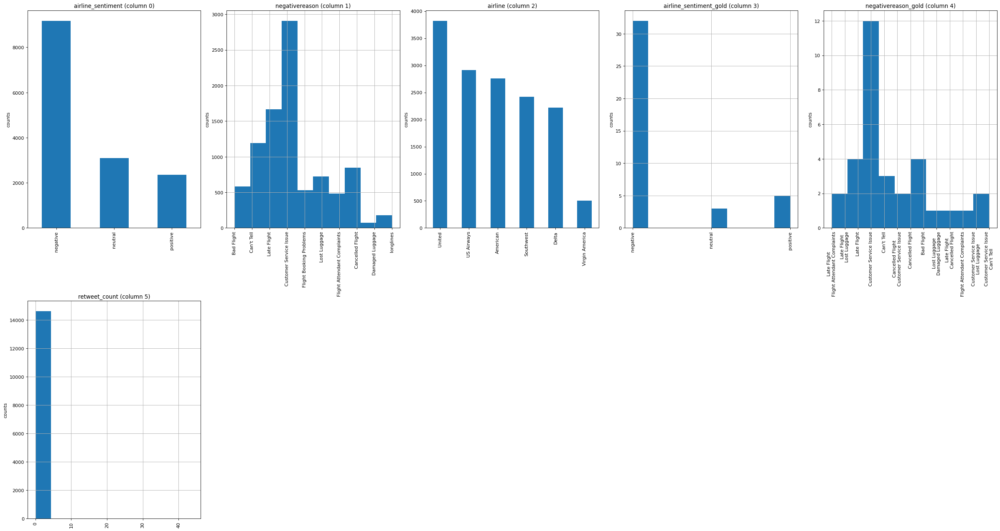

In [31]:
plot_per_column_distribution(data, 10, 5)


array([[<Axes: title={'center': 'tweet_id'}>,
        <Axes: title={'center': 'airline_sentiment_confidence'}>],
       [<Axes: title={'center': 'negativereason_confidence'}>,
        <Axes: title={'center': 'retweet_count'}>],
       [<Axes: title={'center': 'tweet_created'}>, <Axes: >]],
      dtype=object)

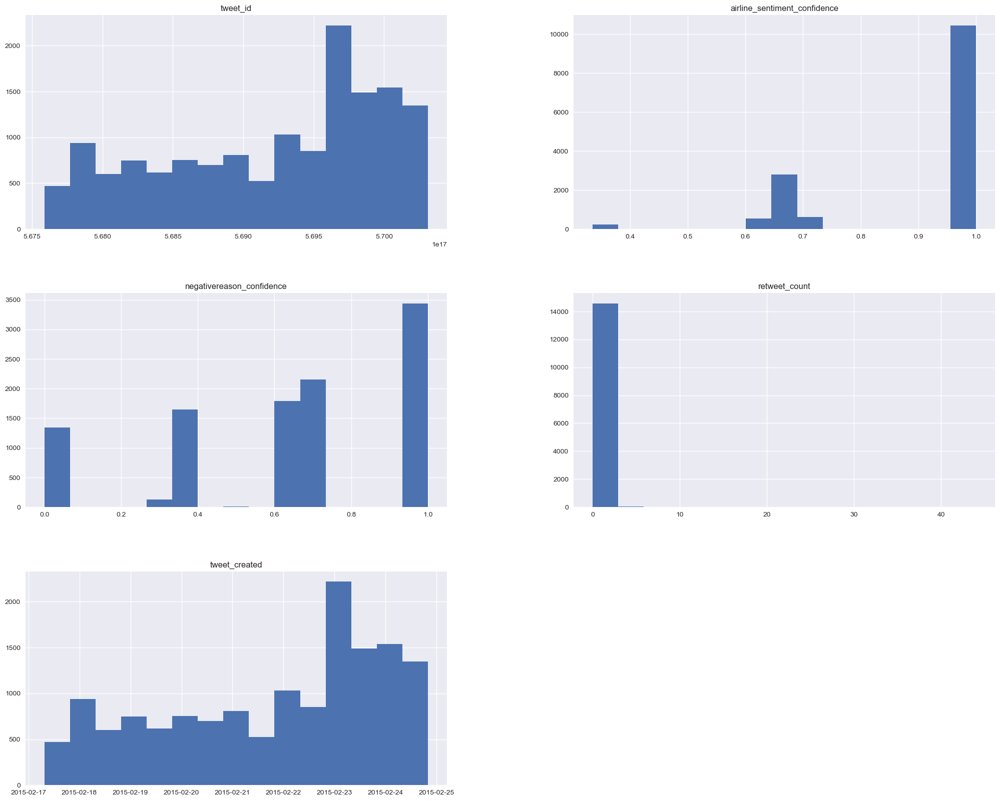

In [32]:
plt.style.use("seaborn")
data.hist(figsize=(25,20), bins=15)

<Axes: xlabel='airline_sentiment', ylabel='count'>

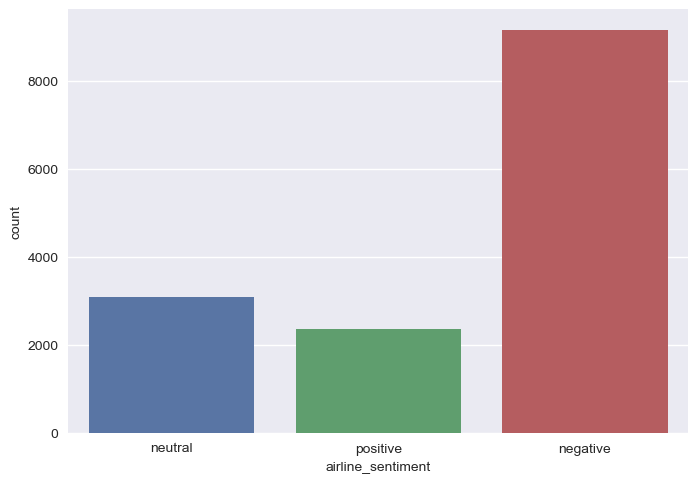

In [33]:
sns.countplot(x="airline_sentiment", data=data)

<Axes: xlabel='airline', ylabel='count'>

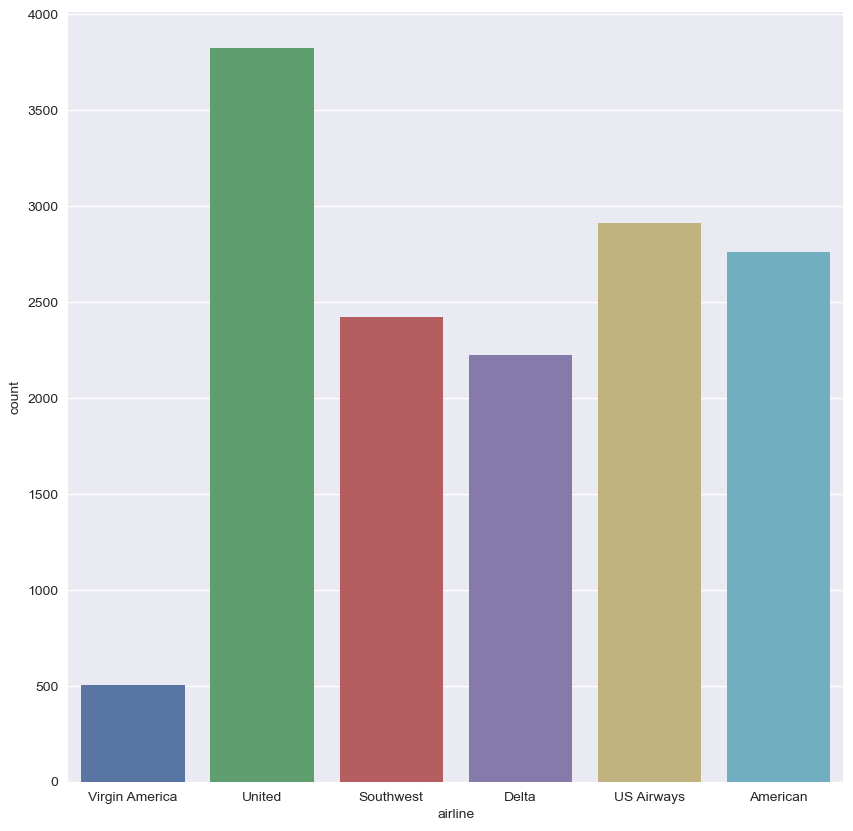

In [34]:
plt.figure(figsize=(10,10))
sns.countplot(x="airline", data=data)

<Axes: xlabel='retweet_count', ylabel='count'>

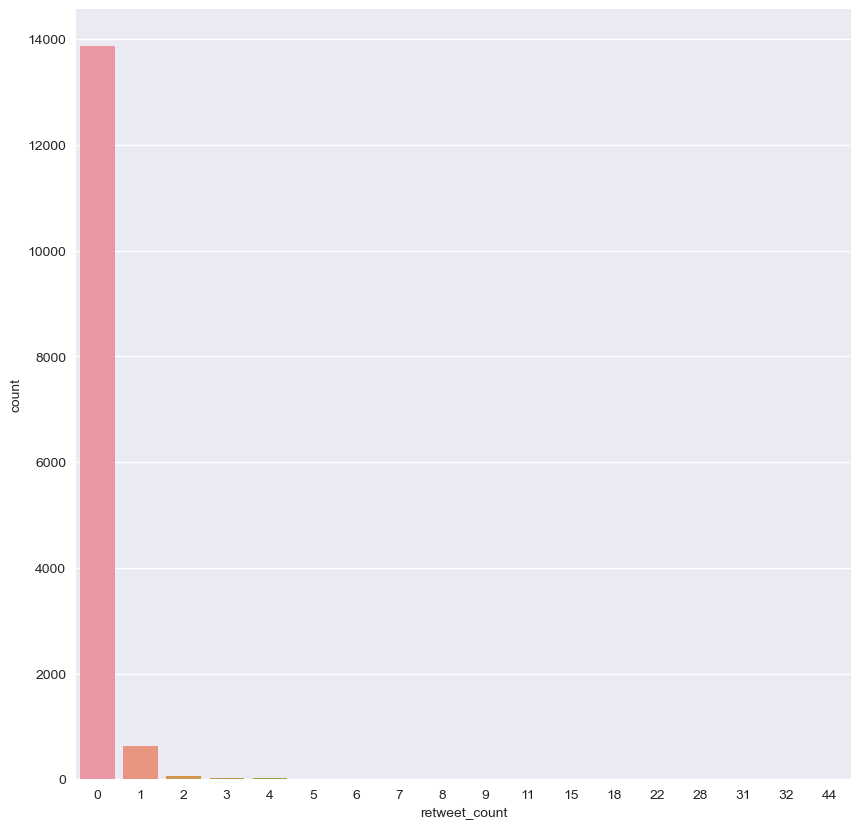

In [35]:
plt.figure(figsize=(10,10))
sns.countplot(x="retweet_count", data=data)

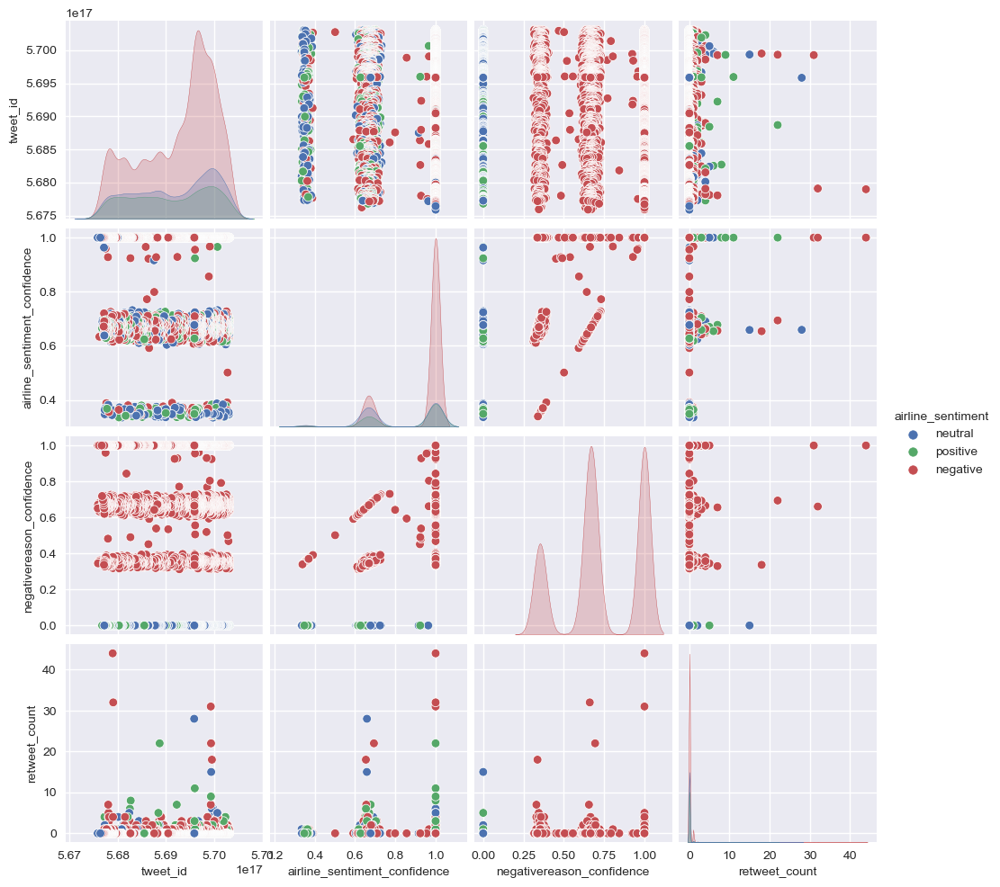

In [36]:
sns.pairplot(data,hue='airline_sentiment')

Total number of tweets for each airline 
  airline
United            3822
US Airways        2913
American          2759
Southwest         2420
Delta             2222
Virgin America     504
Name: airline_sentiment, dtype: int64


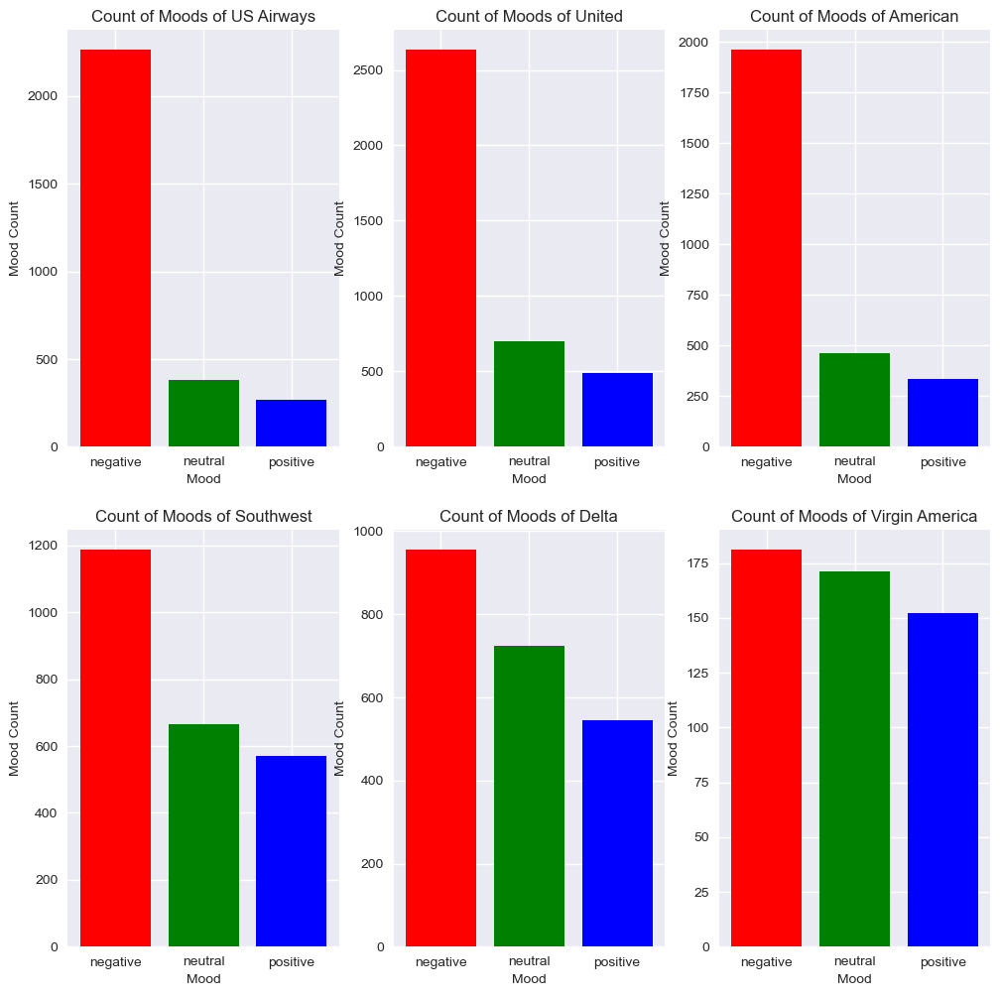

In [37]:
print("Total number of tweets for each airline \n ",data.groupby('airline')['airline_sentiment'].count().sort_values(ascending=False))
airlines= ['US Airways','United','American','Southwest','Delta','Virgin America']
plt.figure(1,figsize=(12, 12))
for i in airlines:
    indices= airlines.index(i)
    plt.subplot(2,3,indices+1)
    new_df=data[data['airline']==i]
    count=new_df['airline_sentiment'].value_counts()
    Index = [1,2,3]
    plt.bar(Index,count, color=['red', 'green', 'blue'])
    plt.xticks(Index,['negative','neutral','positive'])
    plt.ylabel('Mood Count')
    plt.xlabel('Mood')
    plt.title('Count of Moods of '+i)

            Percent Negative
American            0.710402
Delta               0.429793
Southwest           0.490083
US Airways          0.776862
United              0.688906
Virgin              0.359127


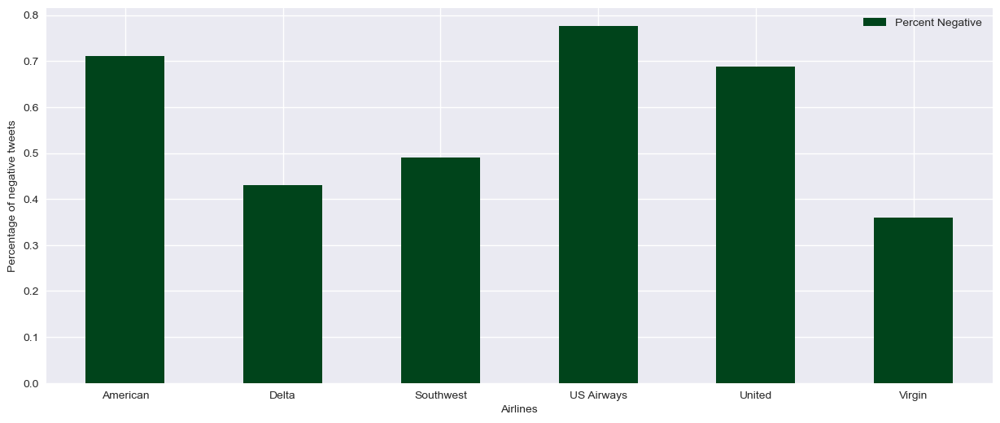

In [38]:
neg_tweets = data.groupby(['airline','airline_sentiment']).count().iloc[:,0]
total_tweets = data.groupby(['airline'])['airline_sentiment'].count()

my_dict = {'American':neg_tweets[0] / total_tweets[0],'Delta':neg_tweets[3] / total_tweets[1],'Southwest': neg_tweets[6] / total_tweets[2],
'US Airways': neg_tweets[9] / total_tweets[3],'United': neg_tweets[12] / total_tweets[4],'Virgin': neg_tweets[15] / total_tweets[5]}
perc = pd.DataFrame.from_dict(my_dict, orient = 'index')
perc.columns = ['Percent Negative']
print(perc)
ax = perc.plot(kind = 'bar', rot=0, colormap = 'Greens_r', figsize = (15,6))
ax.set_xlabel('Airlines')
ax.set_ylabel('Percentage of negative tweets')
plt.show()

<Axes: xlabel='airline'>

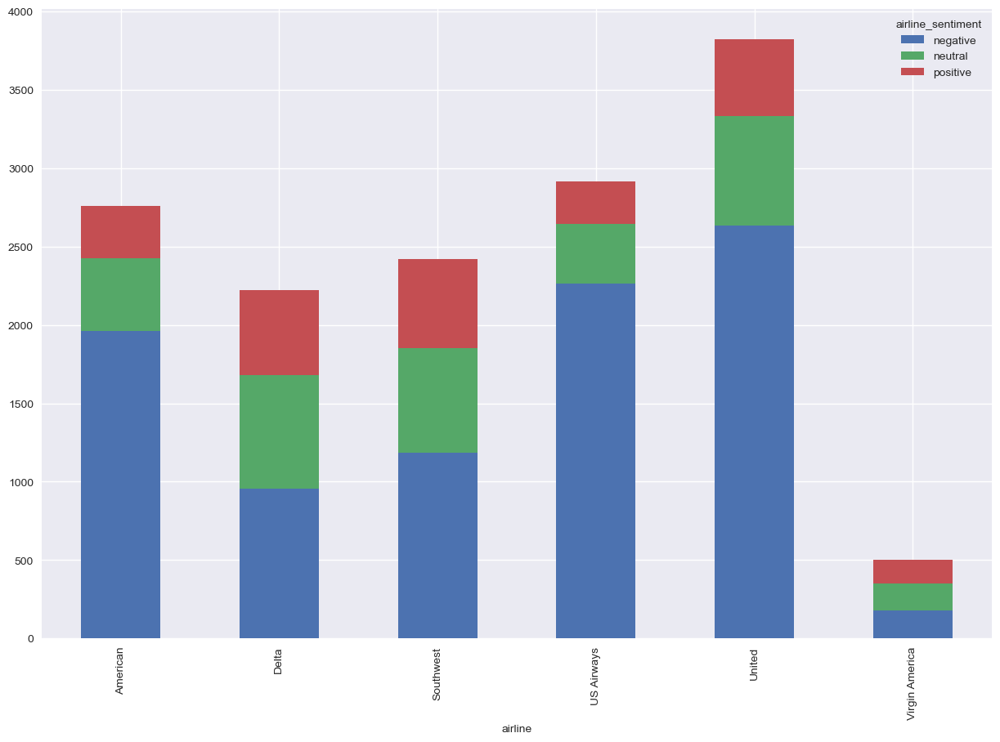

In [39]:
figure_2 = data.groupby(['airline', 'airline_sentiment']).size()
figure_2.unstack().plot(kind='bar', stacked=True, figsize=(15,10))

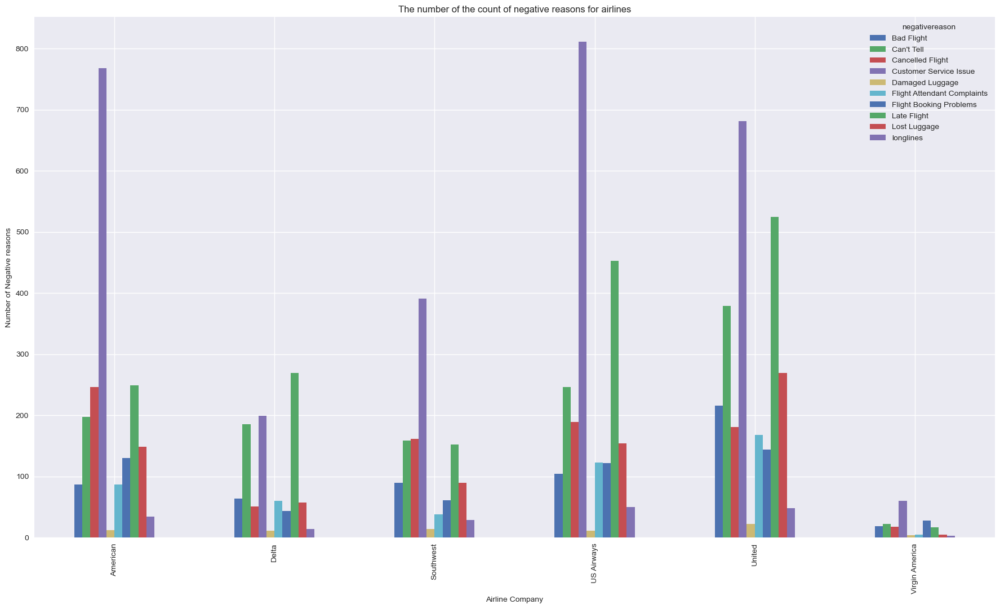

In [40]:
negative_reasons = data.groupby('airline')['negativereason'].value_counts(ascending=True)
negative_reasons.groupby(['airline','negativereason']).sum().unstack().plot(kind='bar',figsize=(22,12))
plt.xlabel('Airline Company')
plt.ylabel('Number of Negative reasons')
plt.title("The number of the count of negative reasons for airlines")
plt.show()

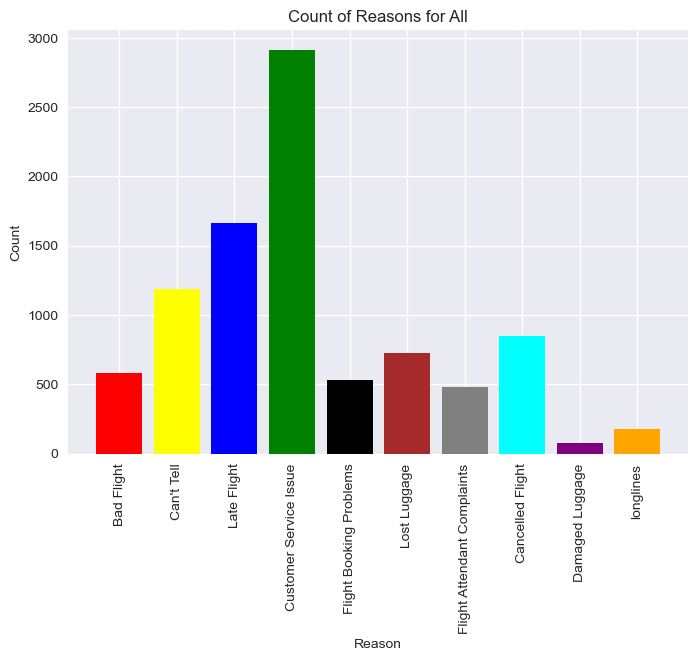

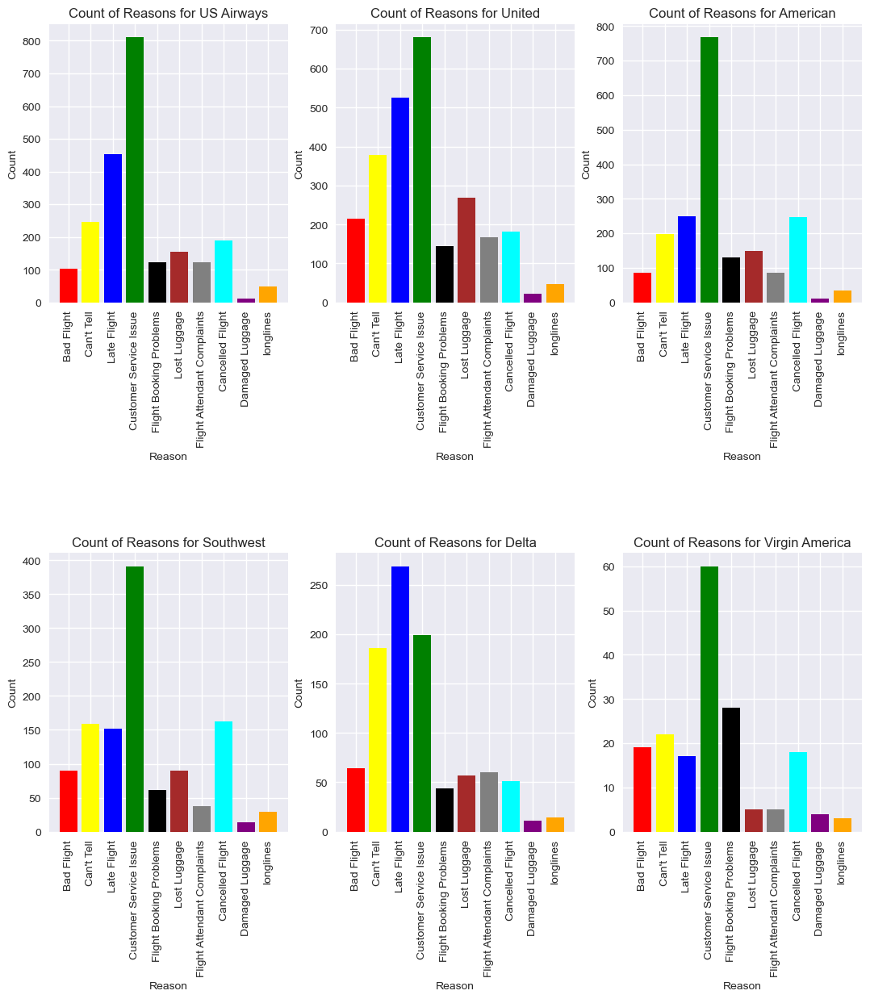

In [41]:
data['negativereason'].nunique()

NR_Count=dict(data['negativereason'].value_counts(sort=False))
def NR_Count(Airline):
    if Airline=='All':
        a=data
    else:
        a=data[data['airline']==Airline]
    count=dict(a['negativereason'].value_counts())
    Unique_reason=list(data['negativereason'].unique())
    Unique_reason=[x for x in Unique_reason if str(x) != 'nan']
    Reason_frame=pd.DataFrame({'Reasons':Unique_reason})
    Reason_frame['count']=Reason_frame['Reasons'].apply(lambda x: count[x])
    return Reason_frame
def plot_reason(Airline):
    
    a=NR_Count(Airline)
    count=a['count']
    Index = range(1,(len(a)+1))
    plt.bar(Index,count, color=['red','yellow','blue','green','black','brown','gray','cyan','purple','orange'])
    plt.xticks(Index,a['Reasons'],rotation=90)
    plt.ylabel('Count')
    plt.xlabel('Reason')
    plt.title('Count of Reasons for '+Airline)
    
plot_reason('All')
plt.figure(2,figsize=(13, 13))
for i in airlines:
    indices= airlines.index(i)
    plt.subplot(2,3,indices+1)
    plt.subplots_adjust(hspace=0.9)
    plot_reason(i)

In [42]:
date = data.reset_index()
#convert the Date column to pandas datetime
date.tweet_created = pd.to_datetime(date.tweet_created)
#Reduce the dates in the date column to only the date and no time stamp using the 'dt.date' method
date.tweet_created = date.tweet_created.dt.date
date.tweet_created.head()
df = date
day_df = df.groupby(['tweet_created','airline','airline_sentiment']).size()
# day_df = day_df.reset_index()
day_df

tweet_created  airline         airline_sentiment
2015-02-16     Delta           negative               1
                               neutral                1
               United          negative               2
2015-02-17     Delta           negative             108
                               neutral               86
                                                   ... 
2015-02-24     United          neutral               49
                               positive              25
               Virgin America  negative              10
                               neutral                6
                               positive              13
Length: 136, dtype: int64

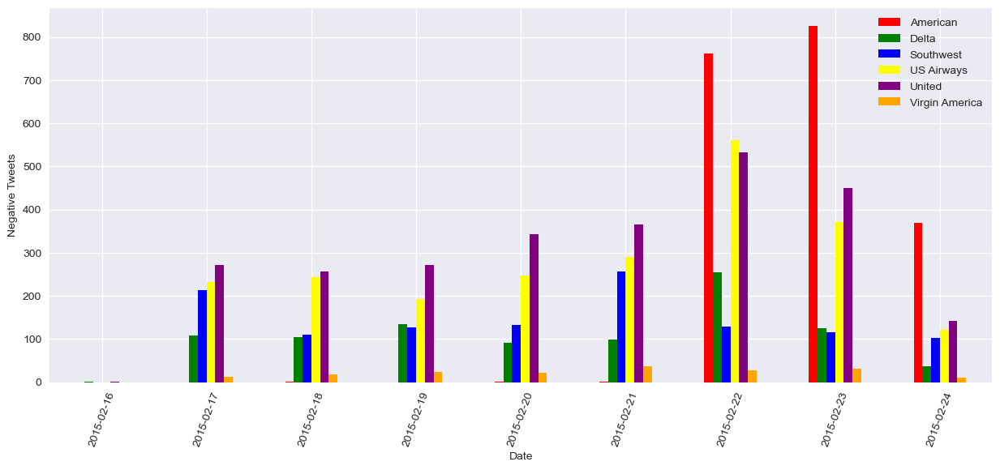

In [43]:
day_df = day_df.loc(axis=0)[:,:,'negative']

#groupby and plot data
ax2 = day_df.groupby(['tweet_created','airline']).sum().unstack().plot(kind = 'bar', color=['red', 'green', 'blue','yellow','purple','orange'], figsize = (15,6), rot = 70)
labels = ['American','Delta','Southwest','US Airways','United','Virgin America']
ax2.legend(labels = labels)
ax2.set_xlabel('Date')
ax2.set_ylabel('Negative Tweets')
plt.show()

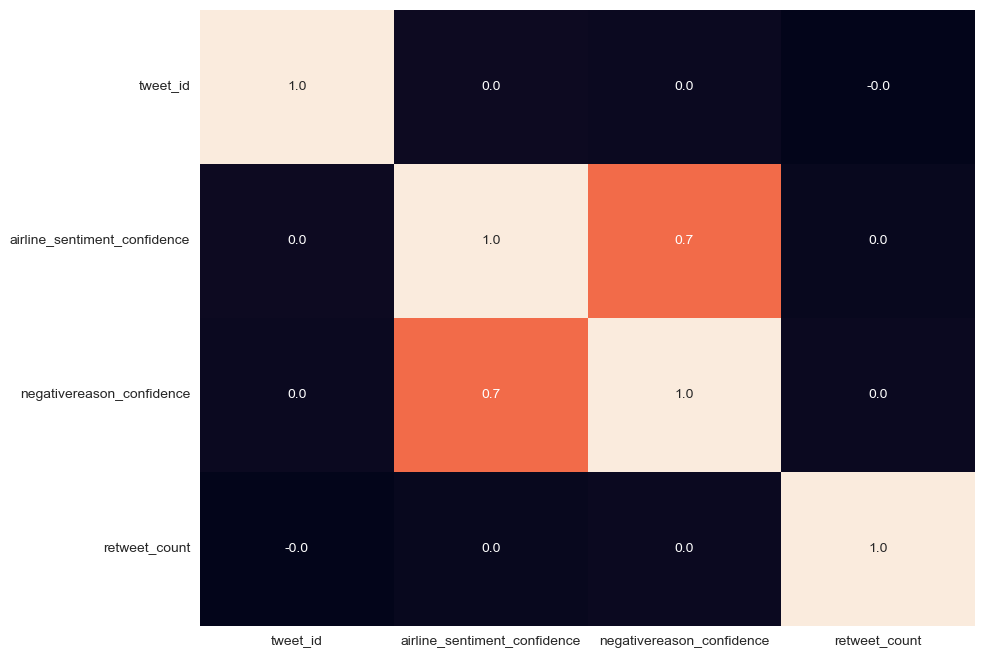

In [44]:
plt.figure(figsize=(10,8))
sns.heatmap(data.corr(),annot=True,cbar=False,fmt='.1f')
plt.show()

In [45]:
# Duygu ve retweet sayısı arasındaki korelasyonu hesaplama
correlation = df['airline_sentiment'].apply(lambda x: 1 if x == 'positive' else -1 if x == 'negative' else 0).corr(df['retweet_count'])
print(f'Correlation: {correlation}')


Correlation: -0.015717274487573017


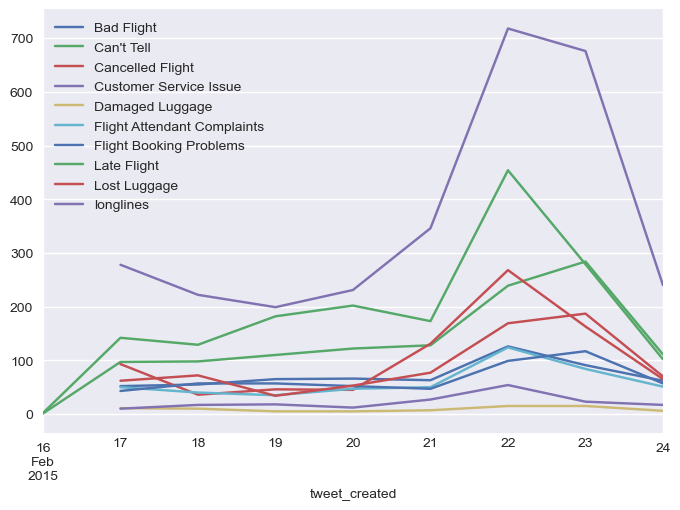

In [46]:
# Her bir negativereason için duygu sayısını çizdirme
grouped = data.groupby('negativereason')
for name, group in grouped:
    group.resample('D', on='tweet_created')['airline_sentiment'].count().plot(label=name)
plt.legend()


Text(0.5, 1.0, 'Features Correlating with airline sentiment confidence')

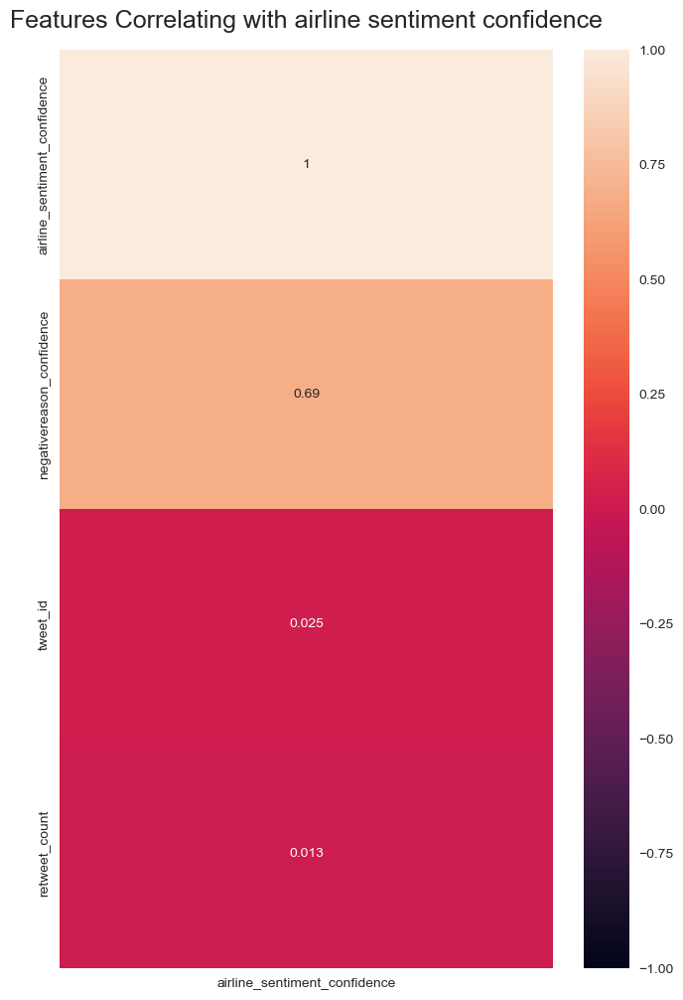

In [47]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(data.corr()[['airline_sentiment_confidence']].sort_values(by='airline_sentiment_confidence', ascending=False), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Features Correlating with airline sentiment confidence', fontdict={'fontsize':18}, pad=16)

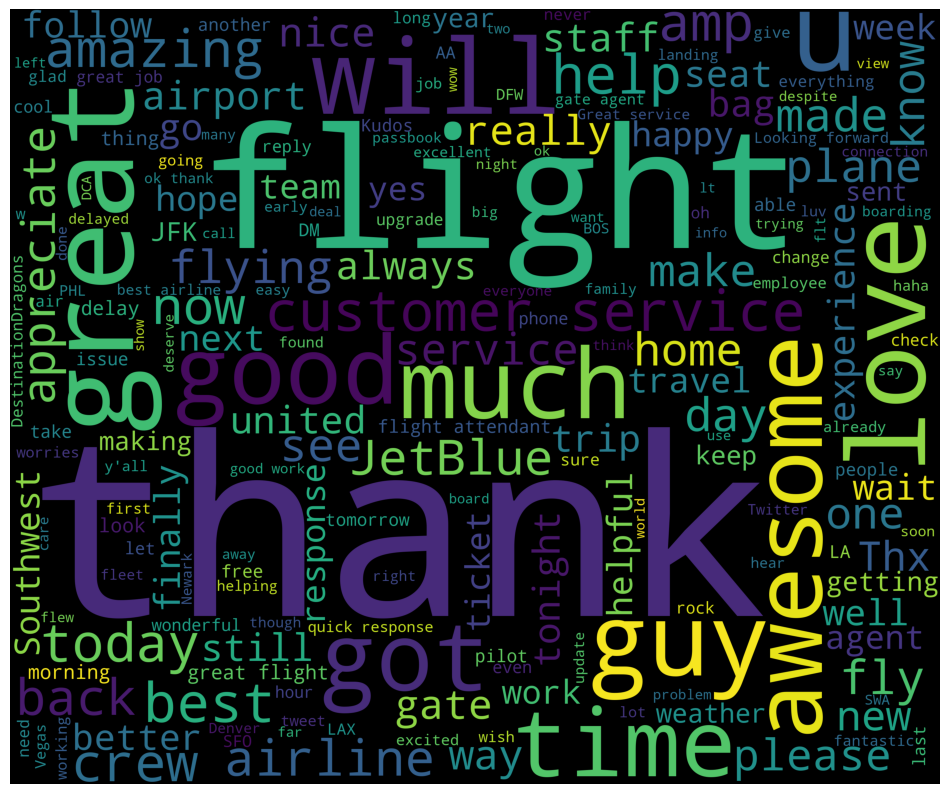

In [48]:
from wordcloud import WordCloud,STOPWORDS
new_df=data[data['airline_sentiment']=='positive']
words = ' '.join(new_df['text'])
cleaned_word = " ".join([word for word in words.split()
                            if 'http' not in word
                                and not word.startswith('@')
                                and word != 'RT'
                            ])
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

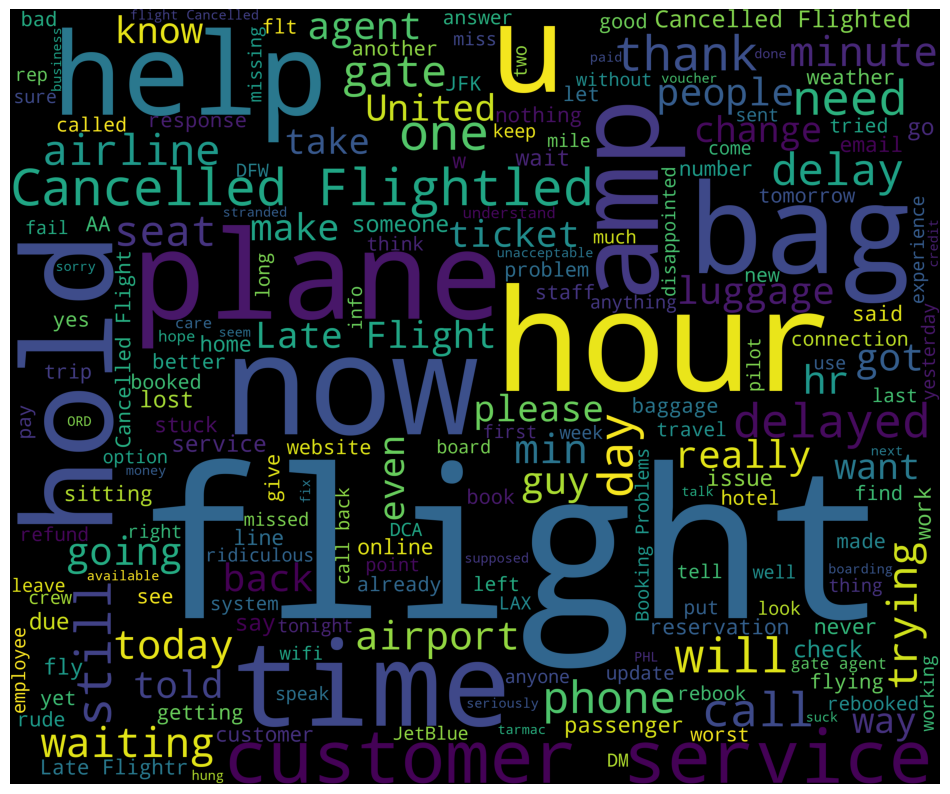

In [49]:
new_df=data[data['airline_sentiment']=='negative']
words = ' '.join(new_df['text'])
cleaned_word = " ".join([word for word in words.split()
                            if 'http' not in word
                                and not word.startswith('@')
                                and word != 'RT'
                            ])
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [50]:
def clean_the_tweet(text):
  tokens= nltk.word_tokenize(re.sub("[^a-zA-Z]", " ",text))
  tokens = [token.lower() for token in tokens]
  return ' '.join(tokens[2:])

                 

def text_process(msg):
  nopunc =[char for char in msg if char not in string.punctuation]
  nopunc=''.join(nopunc)
  return ' '.join([word for word in nopunc.split() if word.lower() not in stopwords.words('english')])


 
def check_scores(clf,X_train, X_test, y_train, y_test):

  model=clf.fit(X_train, y_train)
  predicted_class=model.predict(X_test)
  predicted_class_train=model.predict(X_train)
  test_probs = model.predict_proba(X_test)
  test_probs = test_probs[:, 1]
  yhat = model.predict(X_test)
  lr_precision, lr_recall, _ = precision_recall_curve(y_test, test_probs)
  lr_f1, lr_auc = f1_score(y_test, yhat), auc(lr_recall, lr_precision)


  print('Train confusion matrix is: ',)
  print(confusion_matrix(y_train, predicted_class_train))

  print()
  print('Test confusion matrix is: ')
  print(confusion_matrix(y_test, predicted_class))
  print()
  print(classification_report(y_test,predicted_class)) 
  print() 
  train_accuracy = accuracy_score(y_train,predicted_class_train)
  test_accuracy = accuracy_score(y_test,predicted_class)

  print("Train accuracy score: ", train_accuracy)
  print("Test accuracy score: ",test_accuracy )
  print()
  train_auc = roc_auc_score(y_train, clf.predict_proba(X_train)[:,1])
  test_auc = roc_auc_score(y_test, clf.predict_proba(X_test)[:,1])

  print("Train ROC-AUC score: ", train_auc)
  print("Test ROC-AUC score: ", test_auc)
  fig, (ax1, ax2) = plt.subplots(1, 2)

  ax1.plot(lr_recall, lr_precision)
  ax1.set(xlabel="Recall", ylabel="Precision")

  plt.subplots_adjust(left=0.5,
                    bottom=0.1, 
                    right=1.5, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
  print()
  print('Are under Precision-Recall curve:', lr_f1)
  
  fpr, tpr, _ = roc_curve(y_test, test_probs)


  ax2.plot(fpr, tpr)
  ax2.set(xlabel='False Positive Rate', ylabel='True Positive Rate')

  print("Area under ROC-AUC:", lr_auc)
  return train_accuracy, test_accuracy, train_auc, test_auc



def grid_search(model, parameters, X_train, Y_train):
  #Doing a grid
  grid = GridSearchCV(estimator=model,
                       param_grid = parameters,
                       cv = 2, verbose=2, scoring='roc_auc')
  #Fitting the grid 
  grid.fit(X_train,Y_train)
  print()
  print()
  # Best model found using grid search
  optimal_model = grid.best_estimator_
  print('Best parameters are: ')
  print( grid.best_params_)

  return optimal_model

### Text Preparation

In [51]:
df = df[df['airline_sentiment']!='neutral']
df['cleaned_tweet'] = df['text'].apply(clean_the_tweet)

df.head()
df['airline_sentiment'] = df['airline_sentiment'].apply(lambda x: 1 if x =='positive' else 0)
df.head()

,index,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone,cleaned_tweet
1,1,570301130888122368,1,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24,NaN,Pacific Time (US & Canada),you ve added commercials to the experience tacky
3,3,570301031407624196,0,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24,NaN,Pacific Time (US & Canada),s really aggressive to blast obnoxious enterta...
4,4,570300817074462722,0,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24,NaN,Pacific Time (US & Canada),it s a really big bad thing about it
5,5,570300767074181121,0,1.0000,Can't Tell,0.6842,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica seriously would pay $30 a fligh...,NaN,2015-02-24,NaN,Pacific Time (US & Canada),would pay a flight for seats that didn t have ...
6,6,570300616901320704,1,0.6745,NaN,0.0000,Virgin America,NaN,cjmcginnis,NaN,0,"@VirginAmerica yes, nearly every time I fly VX...",NaN,2015-02-24,San Francisco CA,Pacific Time (US & Canada),nearly every time i fly vx this ear worm won t...


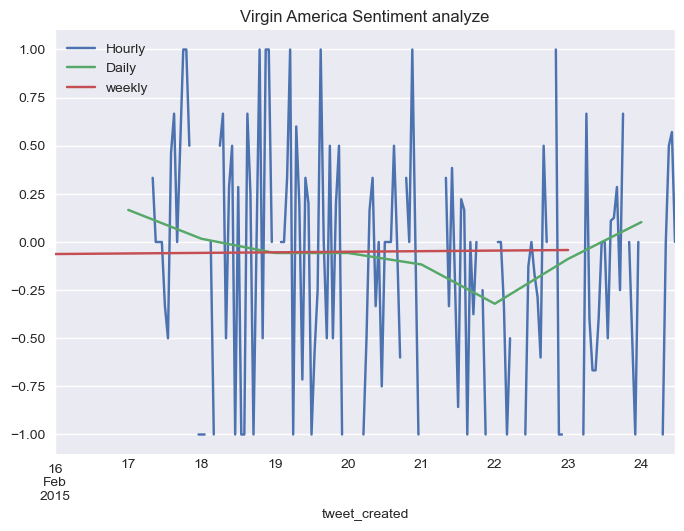

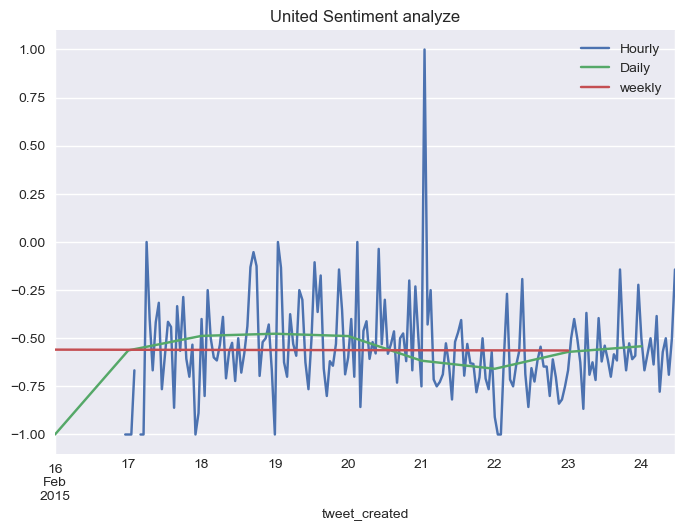

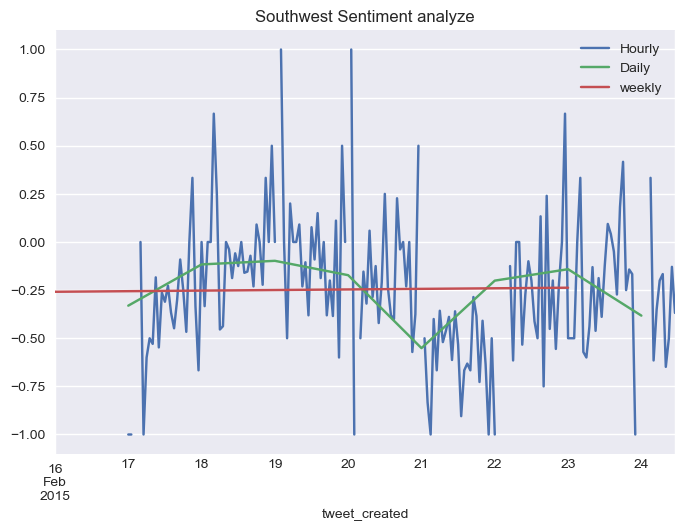

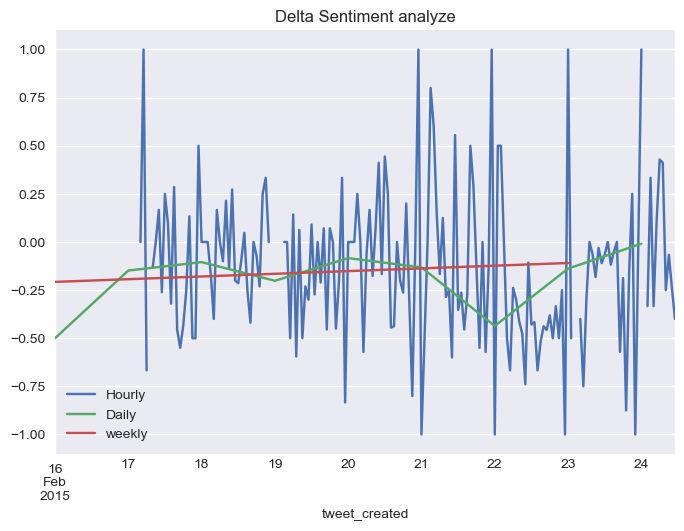

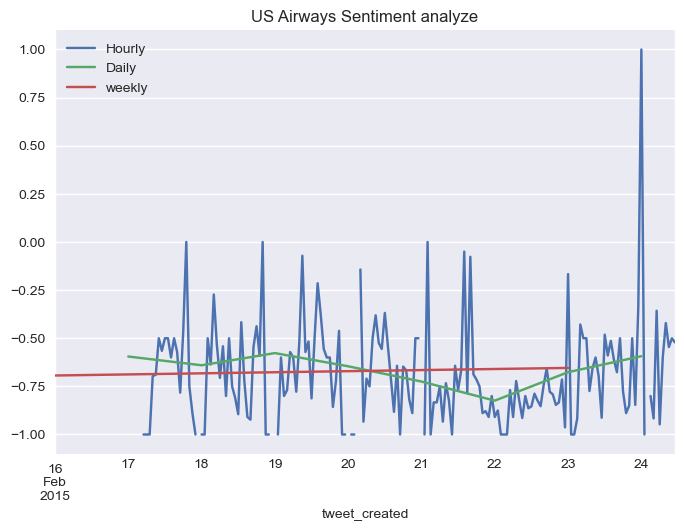

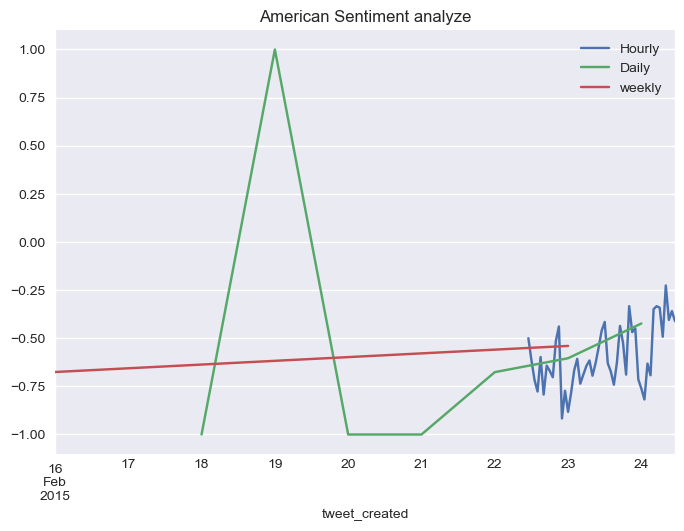

In [52]:
import pandas as pd
import matplotlib.pyplot as plt

# Veri setini okuyun
df = pd.read_csv('Tweets.csv')

# 'tweet_created' sütununu tarih saatine çevirin
df['tweet_created'] = pd.to_datetime(df['tweet_created'])

# Duyguları sayısal değerlere çevirin
df['airline_sentiment'] = df['airline_sentiment'].map({'positive': 1, 'neutral': 0, 'negative': -1})

# Her hava yolu şirketi için grupla ve resample ile veriyi zaman dilimlerine bölelim
for airline in df['airline'].unique():
    airline_df = df[df['airline'] == airline]
    
    hourly_sentiment = airline_df.resample('H', on='tweet_created')['airline_sentiment'].mean()
    daily_sentiment = airline_df.resample('D', on='tweet_created')['airline_sentiment'].mean()
    weekly_sentiment = airline_df.resample('W', on='tweet_created')['airline_sentiment'].mean()
    
    hourly_sentiment.plot(label='Hourly')
    daily_sentiment.plot(label='Daily')
    weekly_sentiment.plot(label='weekly')

    plt.legend()
    plt.title(f'{airline} Sentiment analyze')
    plt.show()


In [53]:
df['airline_sentiment'].unique()

array([ 0,  1, -1], dtype=int64)

### Base SVM model with TF-IDF

In [55]:
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

# NLTK'nın stop words listesini indirin
import nltk
nltk.download('stopwords')

# Porter Stemmer'ı oluşturun (isteğe bağlı)
stemmer = PorterStemmer()

# Stop words listesi
stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Noktalama işaretlerini ve sayıları kaldır
    text = re.sub('[^a-zA-Z]', ' ', text)
    
    # Tüm metni küçük harfe çevir
    text = text.lower()
    
    # Metni kelimelere böl (tokenize)
    text = text.split()
    
    # Stop words'leri kaldır ve stemming yap
    text = [stemmer.stem(word) for word in text if not word in stop_words]
    
    # Kelimeleri birleştir ve sonucu döndür
    return ' '.join(text)

# 'cleaned_tweet' sütununu oluştur
df['cleaned_tweet'] = df['text'].apply(clean_text)

# TF-IDF vectorizer
vectorizer = TfidfVectorizer(use_idf=True, lowercase=True)
X_tf_idf = vectorizer.fit_transform(df.cleaned_tweet)
x_train, x_test, y_train, y_test = train_test_split(X_tf_idf, df['airline_sentiment'], random_state=42)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\dovle\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [56]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

def check_scores(clf,X_train, X_test, y_train, y_test):
    model = clf.fit(X_train, y_train)
    
    # Predict classes
    predicted_class = model.predict(X_test)
    predicted_class_train = model.predict(X_train)
    
    # Accuracy scores
    train_accuracy = accuracy_score(y_train, predicted_class_train)
    test_accuracy = accuracy_score(y_test, predicted_class)
    
    # F1 scores
    train_f1 = f1_score(y_train, predicted_class_train, average='macro')
    test_f1 = f1_score(y_test, predicted_class, average='macro')
    
    # Confusion matrix for test data
    conf_matrix = confusion_matrix(y_test, predicted_class)
    
    print('Train Accuracy is: ', train_accuracy)
    print('Test Accuracy is: ', test_accuracy)
    
    print('Train F1 Score is: ', train_f1)
    print('Test F1 Score is: ', test_f1)
    
    print('Test Confusion Matrix:')
    print(conf_matrix)
    
    return train_accuracy, test_accuracy, train_f1, test_f1, conf_matrix


### optimizing the hyperparameters with TF-IDF

In [57]:
parameters ={
    "C":[0.1,1,10],
    "kernel":['linear', 'rbf', 'sigmoid'],
    "gamma":['scale', 'auto']
}



svm_optimal = grid_search(svm.SVC(probability=True), parameters,x_train, y_train)

Fitting 2 folds for each of 18 candidates, totalling 36 fits
[CV] END ..................C=0.1, gamma=scale, kernel=linear; total time=  10.8s
[CV] END ..................C=0.1, gamma=scale, kernel=linear; total time=  11.2s
[CV] END .....................C=0.1, gamma=scale, kernel=rbf; total time=  15.8s
[CV] END .....................C=0.1, gamma=scale, kernel=rbf; total time=  15.4s
[CV] END .................C=0.1, gamma=scale, kernel=sigmoid; total time=  13.3s
[CV] END .................C=0.1, gamma=scale, kernel=sigmoid; total time=  12.0s
[CV] END ...................C=0.1, gamma=auto, kernel=linear; total time=  10.8s
[CV] END ...................C=0.1, gamma=auto, kernel=linear; total time=  11.2s
[CV] END ......................C=0.1, gamma=auto, kernel=rbf; total time=   9.8s
[CV] END ......................C=0.1, gamma=auto, kernel=rbf; total time=   9.4s
[CV] END ..................C=0.1, gamma=auto, kernel=sigmoid; total time=  11.1s
[CV] END ..................C=0.1, gamma=auto, ke

In [58]:
so_train_accuracy, so_test_accuracy, so_train_f1, so_test_f1, so_conf_matrix = check_scores(svm_optimal,x_train, x_test, y_train, y_test)
def check_scores(clf,X_train, X_test, y_train, y_test):
    # (previous code remains the same) 
    return train_accuracy, test_accuracy, train_f1, test_f1


Train Accuracy is:  0.7070127504553734
Test Accuracy is:  0.7098360655737705
Train F1 Score is:  0.5226778795476839
Test F1 Score is:  0.5040954472681601
Test Confusion Matrix:
[[2304   15   21]
 [ 649   68   21]
 [ 340   16  226]]


### Multinomial Naive Bayes

In [59]:
from sklearn.metrics import accuracy_score, f1_score

def check_scores(clf,X_train, X_test, y_train, y_test):
    model = clf.fit(X_train, y_train)
    
    # Predict classes
    predicted_class = model.predict(X_test)
    predicted_class_train = model.predict(X_train)
    
    # Accuracy scores
    train_accuracy = accuracy_score(y_train, predicted_class_train)
    test_accuracy = accuracy_score(y_test, predicted_class)
    
    # F1 scores
    train_f1 = f1_score(y_train, predicted_class_train, average='macro')
    test_f1 = f1_score(y_test, predicted_class, average='macro')
    
    print('Train Accuracy is: ', train_accuracy)
    print('Test Accuracy is: ', test_accuracy)
    
    print('Train F1 Score is: ', train_f1)
    print('Test F1 Score is: ', test_f1)
    
    return train_accuracy, test_accuracy, train_f1, test_f1


In [60]:
m_train_accuracy, m_test_accuracy, m_train_auc, m_test_auc = check_scores(MultinomialNB(),x_train, x_test, y_train, y_test)

Train Accuracy is:  0.7211293260473588
Test Accuracy is:  0.694535519125683
Train F1 Score is:  0.5484091529356435
Test F1 Score is:  0.4538713818112398


### Gaussian Naive Bayes

In [61]:
g_train_accuracy, g_test_accuracy, g_train_auc, g_test_auc=check_scores(GaussianNB(),x_train.toarray(), x_test.toarray(), y_train, y_test)

Train Accuracy is:  0.6717668488160291
Test Accuracy is:  0.42595628415300546
Train F1 Score is:  0.6501256781770819
Test F1 Score is:  0.39080748922033887


###  AdaBoost

In [62]:
a_train_accuracy, a_test_accuracy, a_train_auc, a_test_auc=check_scores(AdaBoostClassifier(),x_train,x_test, y_train, y_test)

Train Accuracy is:  0.7252276867030966
Test Accuracy is:  0.7311475409836066
Train F1 Score is:  0.5978419649729932
Test F1 Score is:  0.5963698061008319


### AdaBoost with hyperparameters

In [63]:
params = {'n_estimators': [10, 50, 100, 500],
 'learning_rate': [0.0001, 0.001, 0.01, 0.1, 1.0],
 'algorithm': ['SAMME', 'SAMME.R']}

ada_optimal_model = grid_search(AdaBoostClassifier(), params,x_train, y_train)

Fitting 2 folds for each of 40 candidates, totalling 80 fits
[CV] END algorithm=SAMME, learning_rate=0.0001, n_estimators=10; total time=   0.4s
[CV] END algorithm=SAMME, learning_rate=0.0001, n_estimators=10; total time=   0.4s
[CV] END algorithm=SAMME, learning_rate=0.0001, n_estimators=50; total time=   2.5s
[CV] END algorithm=SAMME, learning_rate=0.0001, n_estimators=50; total time=   2.4s
[CV] END algorithm=SAMME, learning_rate=0.0001, n_estimators=100; total time=   5.6s
[CV] END algorithm=SAMME, learning_rate=0.0001, n_estimators=100; total time=   5.1s
[CV] END algorithm=SAMME, learning_rate=0.0001, n_estimators=500; total time=  26.5s
[CV] END algorithm=SAMME, learning_rate=0.0001, n_estimators=500; total time=  25.7s
[CV] END algorithm=SAMME, learning_rate=0.001, n_estimators=10; total time=   0.4s
[CV] END algorithm=SAMME, learning_rate=0.001, n_estimators=10; total time=   0.4s
[CV] END algorithm=SAMME, learning_rate=0.001, n_estimators=50; total time=   2.6s
[CV] END algor

In [64]:
ao_train_accuracy, ao_test_accuracy, ao_train_auc, ao_test_auc=check_scores(ada_optimal_model,x_train,x_test, y_train, y_test)

Train Accuracy is:  0.6678506375227686
Test Accuracy is:  0.6816939890710383
Train F1 Score is:  0.4362895381440701
Test F1 Score is:  0.4391682789919981


### KNeighbors

In [65]:
from sklearn.neighbors import KNeighborsClassifier
knn_train_accuracy, knn_test_accuracy, knn_train_auc, knn_test_auc= check_scores(KNeighborsClassifier().fit(x_train, y_train), x_train,x_test,y_train,y_test)

Train Accuracy is:  0.804735883424408
Test Accuracy is:  0.7106557377049181
Train F1 Score is:  0.747185741789841
Test F1 Score is:  0.6214801426315716


### Random Forest

In [66]:
r_train_accuracy, r_test_accuracy, r_train_auc, r_test_auc= check_scores(RandomForestClassifier(random_state=0).fit(x_train, y_train), x_train,x_test,y_train,y_test)

Train Accuracy is:  0.9961748633879781
Test Accuracy is:  0.7693989071038252
Train F1 Score is:  0.9940294949330729
Test F1 Score is:  0.6620029709870341


### Decision Tree

In [67]:
print("x_train shape: ", x_train.shape)
print("y_train shape: ", y_train.shape)


x_train shape:  (10980, 10805)
y_train shape:  (10980,)


In [99]:
from sklearn.model_selection import train_test_split

# assuming that data is your DataFrame and 'airline_sentiment' is the column with the target labels
X = data.drop(columns='airline_sentiment')
Y = data['airline_sentiment']

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

print("X_train shape: ", X_train.shape)
print("Y_train shape: ", Y_train.shape)


X_train shape:  (11712, 14)
Y_train shape:  (11712,)


In [69]:
from sklearn.tree import DecisionTreeClassifier
dt_train_accuracy, dt_test_accuracy, dt_train_auc, dt_test_auc= check_scores(DecisionTreeClassifier(random_state=0).fit(x_train, y_train), x_train,x_test,y_train,y_test)

Train Accuracy is:  0.9961748633879781
Test Accuracy is:  0.6896174863387978
Train F1 Score is:  0.9940256690980657
Test F1 Score is:  0.5959026238066202


### Neural Network

Train confusion matrix is: 
[[6825   30]
 [   5 1795]]

Test confusion matrix is: 
[[2125  198]
 [ 178  385]]

              precision    recall  f1-score   support

           0       0.92      0.91      0.92      2323
           1       0.66      0.68      0.67       563

    accuracy                           0.87      2886
   macro avg       0.79      0.80      0.80      2886
weighted avg       0.87      0.87      0.87      2886


Train accuracy score:  0.9959560947429231
Test accuracy score:  0.8697158697158697

Train ROC-AUC score:  0.9998520139395413
Test ROC-AUC score:  0.9014878628954872

Are under Precision-Recall curve: 0.6719022687609075
Area under ROC-AUC: 0.724167033127511


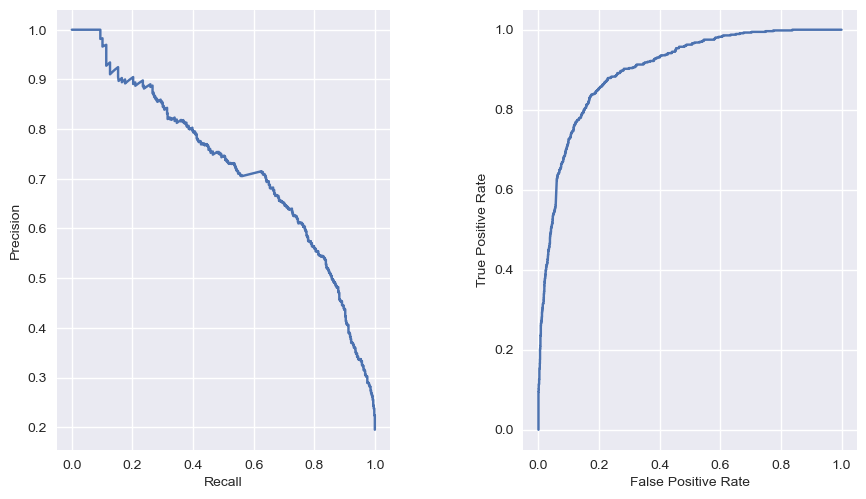

In [89]:
from sklearn.neural_network import MLPClassifier
mlp_train_accuracy, mlp_test_accuracy, mlp_train_auc, mlp_test_auc= check_scores(MLPClassifier(max_iter=500, random_state=42).fit(x_train, y_train), x_train,x_test,y_train,y_test)

### LSTM

In [71]:
corpus = [df['cleaned_tweet'][i] for i in range( len(df))]

voc_size=5000

onehot_=[one_hot(words,voc_size)for words in corpus] 

max_sent_length=max([len(i) for i in corpus])

embedded_docs=pad_sequences(onehot_,padding='pre',maxlen=max_sent_length)
    
embedding_vector_features=40
model=Sequential()
model.add(Embedding(voc_size,embedding_vector_features,input_length=max_sent_length))
model.add(Dropout(0.3))
model.add(LSTM(100))
model.add(Dropout(0.3))
model.add(Dense(1,activation='sigmoid'))
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

X_final=np.array(embedded_docs)
y_final=np.array(df['airline_sentiment'])
X_final.shape,y_final.shape

((14640, 128), (14640,))

In [72]:
X_train, X_test, y_train, y_test = train_test_split(X_final, y_final, test_size=0.33, random_state=42)
model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=10,batch_size=64)

Epoch 1/10
154/154 [==============================] - 24s 144ms/step - loss: -7.7098 - accuracy: 0.2159 - val_loss: -12.7724 - val_accuracy: 0.2036
Epoch 2/10
154/154 [==============================] - 23s 152ms/step - loss: -15.6915 - accuracy: 0.2156 - val_loss: -20.2085 - val_accuracy: 0.2036
Epoch 3/10
154/154 [==============================] - 22s 144ms/step - loss: -22.5978 - accuracy: 0.2156 - val_loss: -27.3157 - val_accuracy: 0.2036
Epoch 4/10
154/154 [==============================] - 25s 160ms/step - loss: -29.2852 - accuracy: 0.2156 - val_loss: -34.3175 - val_accuracy: 0.2036
Epoch 5/10
154/154 [==============================] - 22s 145ms/step - loss: -35.9032 - accuracy: 0.2156 - val_loss: -41.2213 - val_accuracy: 0.2036
Epoch 6/10
154/154 [==============================] - 23s 150ms/step - loss: -42.5924 - accuracy: 0.2156 - val_loss: -48.1581 - val_accuracy: 0.2036
Epoch 7/10
154/154 [==============================] - 21s 135ms/step - loss: -49.2030 - accuracy: 0.2156 - 

In [73]:
y_test_pred=np.argmax(model.predict(X_test),axis=1)
y_train_pred=np.argmax(model.predict(X_train),axis=1)

307/307 [==============================] - 6s 18ms/step


In [82]:
from keras.utils import to_categorical

y_test_one_hot = to_categorical(y_test)
y_train_one_hot = to_categorical(y_train)


In [83]:
test_roc_lstm = roc_auc_score(y_test_one_hot, y_test_proba, multi_class='ovo') # veya 'ovr'
train_roc_lstm = roc_auc_score(y_train_one_hot, y_train_proba, multi_class='ovo') # veya 'ovr'


In [88]:
print("y_test_proba shape: ", y_test_proba.shape)
print("y_train_proba shape: ", y_train_proba.shape)


y_test_proba shape:  (4832, 1)
y_train_proba shape:  (9808, 1)


In [91]:
from keras.utils import to_categorical

# y'niz [1, 2, 0, 1, 2, ...] gibi bir formatta olmalı
# Aşağıdaki satırları sadece bir kez çağırın
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

print("y_test shape: ", y_test.shape)
print("y_train shape: ", y_train.shape)


y_test shape:  (4832, 2, 2, 2, 2)
y_train shape:  (9808, 2, 2, 2, 2)


In [92]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

num_classes = 2  # Sınıf sayınız

model = Sequential()
# ...
# Diğer katmanlarınız
# ...
model.add(Dense(num_classes, activation='softmax'))  # Son katman


In [93]:
y_test_proba = model.predict(X_test)
y_train_proba = model.predict(X_train)

print("y_test_proba shape: ", y_test_proba.shape)
print("y_train_proba shape: ", y_train_proba.shape)


307/307 [==============================] - 0s 762us/step
y_test_proba shape:  (4832, 2)
y_train_proba shape:  (9808, 2)


In [94]:
num_samples_test = y_test_proba.shape[0]
num_classes_test = y_test.shape[1] # y_test'ı to_categorical ile dönüştürdüyseniz

y_test_proba = y_test_proba.reshape((num_samples_test, num_classes_test))

num_samples_train = y_train_proba.shape[0]
num_classes_train = y_train.shape[1] # y_train'ı to_categorical ile dönüştürdüyseniz

y_train_proba = y_train_proba.reshape((num_samples_train, num_classes_train))


In [106]:
data = [('Random Forest', r_train_accuracy, r_test_accuracy, r_train_auc, r_test_auc),
 ('MultinomialNB',m_train_accuracy, m_test_accuracy, m_train_auc, m_test_auc  ),
('KNeighbors',knn_train_accuracy, knn_test_accuracy, knn_train_auc, knn_test_auc ),
 ('AdaBoost',a_train_accuracy, a_test_accuracy, a_train_auc, a_test_auc ),
('AdaBoost Optimized',ao_train_accuracy, ao_test_accuracy, ao_train_auc, ao_test_auc),
('Decision Tree ',dt_train_accuracy, dt_test_accuracy, dt_train_auc, dt_test_auc),
('Gaussian Naive Bayes',g_train_accuracy, g_test_accuracy, g_train_auc, g_test_auc),


('LSTM',train_acc_lstm, test_acc_lstm, train_roc_lstm, test_roc_lstm )]


Scores_ =pd.DataFrame(data = data, columns=['Model Name','Train Accuracy', 'Test Accuracy', 'Train ROC', 'Test ROC'])
Scores_.set_index('Model Name', inplace = True)

Scores_

,Train Accuracy,Test Accuracy,Train ROC,Test ROC
Model Name,,,,
Random Forest,0.996175,0.769399,0.994029,0.662003
MultinomialNB,0.721129,0.694536,0.548409,0.453871
KNeighbors,0.804736,0.710656,0.747186,0.621480
AdaBoost,0.725228,0.731148,0.597842,0.596370
AdaBoost Optimized,0.667851,0.681694,0.436290,0.439168
Decision Tree,0.996175,0.689617,0.994026,0.595903
Gaussian Naive Bayes,0.671767,0.425956,0.650126,0.390807
LSTM,0.215640,0.203642,0.500000,0.500000


In [114]:
import pandas as pd

data = pd.read_csv('Tweets.csv')


In [115]:
print('tweet_created' in data.columns)


True


In [116]:
# "tweet_created" sütununu datetime türüne dönüştürme
data['tweet_created'] = pd.to_datetime(data['tweet_created'])

# Tarih bilgilerini ayrı bir sütunda saklama
data['date'] = data['tweet_created'].dt.date

# Her bir tarih için tweet sayısını hesaplama
tweet_counts = data.groupby('date').size()

# Sonuçları gösterme
print(tweet_counts)
print()


date
2015-02-16       4
2015-02-17    1408
2015-02-18    1344
2015-02-19    1376
2015-02-20    1500
2015-02-21    1557
2015-02-22    3079
2015-02-23    3028
2015-02-24    1344
dtype: int64


In [150]:
# tweet_created sütununu tarih-zaman formatına dönüştürme
data['tweet_created'] = pd.to_datetime(data['tweet_created'])

# tweet_created sütununu indeks yapma
data.set_index('tweet_created', inplace=True)

# her bir saat için tweet sayısını hesaplama
tweet_counts = data['tweet_id'].resample('H').count()


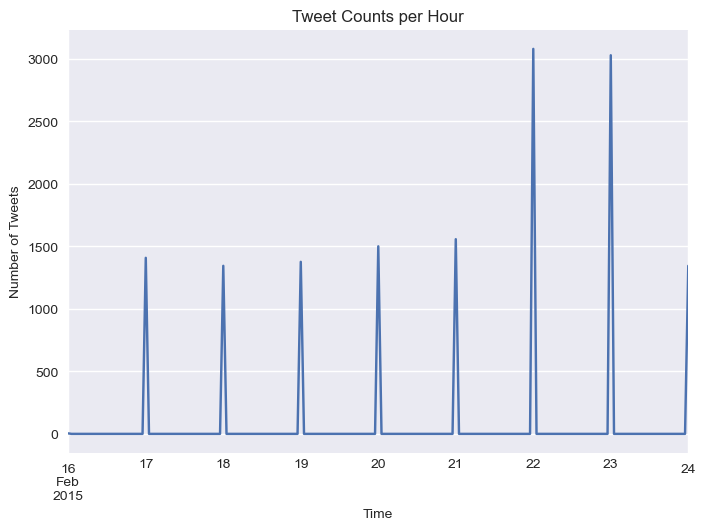

In [151]:
import matplotlib.pyplot as plt

tweet_counts.plot()
plt.title('Tweet Counts per Hour')
plt.xlabel('Time')
plt.ylabel('Number of Tweets')
plt.show()


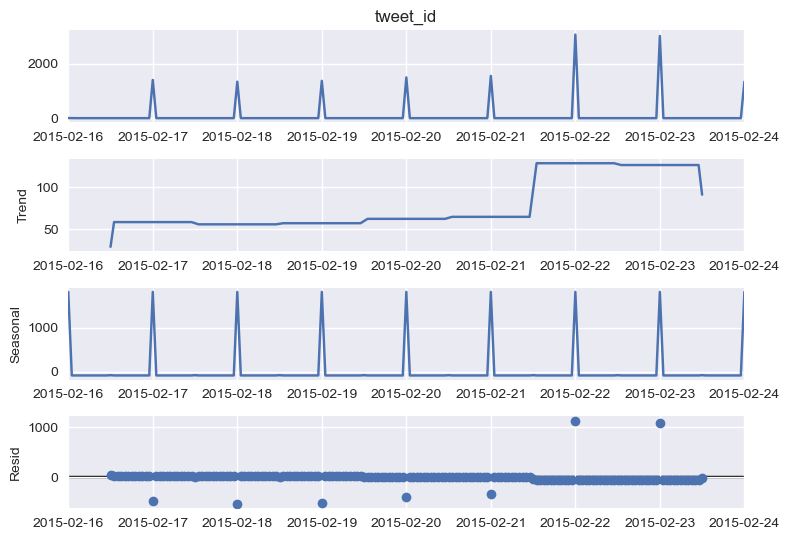

In [152]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Eğilim ve dönemlilik analizi
result = seasonal_decompose(tweet_counts, model='additive')

# Çizdirme
result.plot()
plt.show()


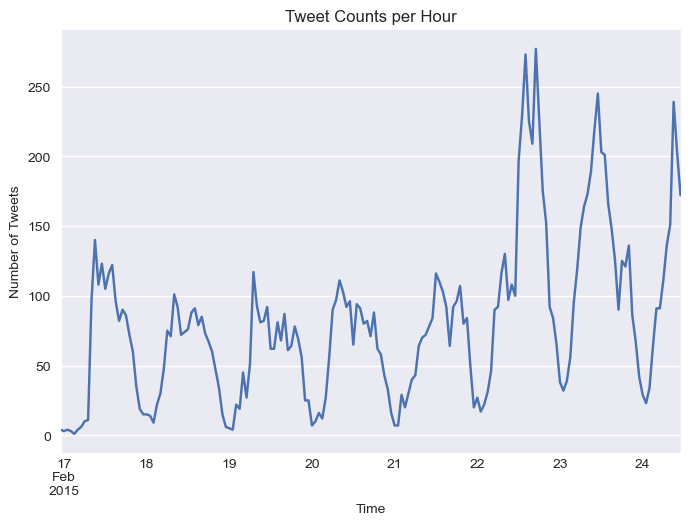

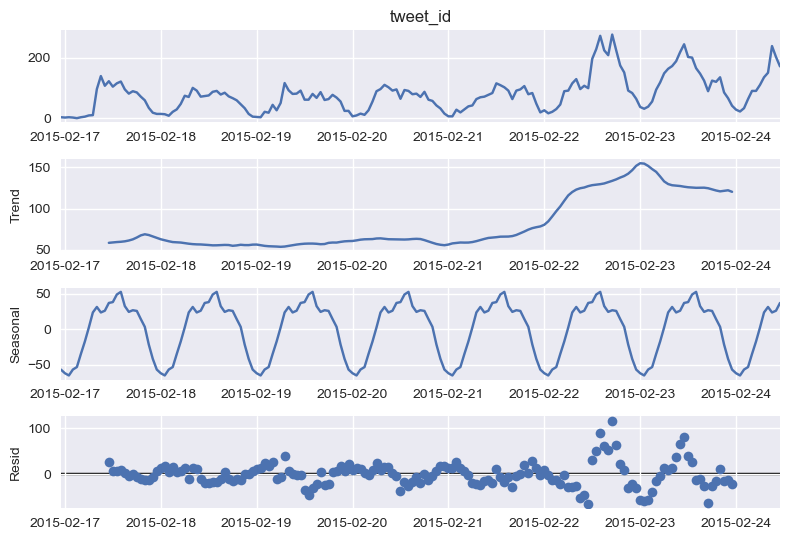

In [154]:
# Gerekli kütüphanelerin yüklenmesi
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Verinin yüklenmesi
data = pd.read_csv('Tweets.csv')

# tweet_created sütununu tarih-zaman formatına dönüştürme
data['tweet_created'] = pd.to_datetime(data['tweet_created'])

# tweet_created sütununu indeks yapma
data.set_index('tweet_created', inplace=True)

# her bir saat için tweet sayısını hesaplama
tweet_counts = data['tweet_id'].resample('H').count()

# Tweet sayısının çizdirilmesi
tweet_counts.plot()
plt.title('Tweet Counts per Hour')
plt.xlabel('Time')
plt.ylabel('Number of Tweets')
plt.show()

# Eğilim ve dönemlilik analizi
result = seasonal_decompose(tweet_counts, model='additive')

# Eğilim ve dönemlilik çizdirme
result.plot()
plt.show()


### Holt-Winters model

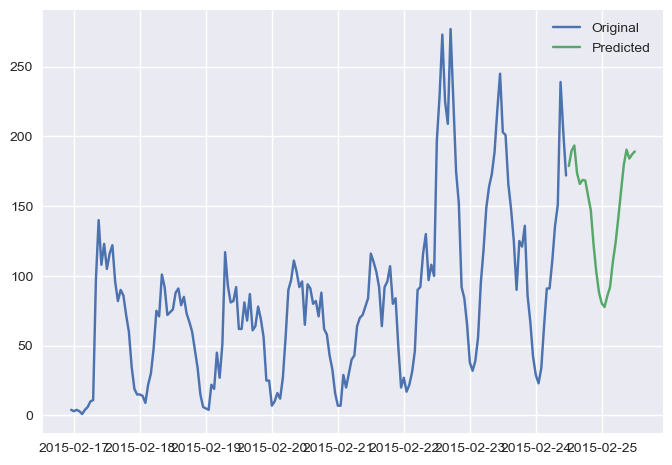

In [155]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Modelin oluşturulması
model = ExponentialSmoothing(tweet_counts, trend='add', seasonal='add', seasonal_periods=24)

# Modelin eğitilmesi
model_fit = model.fit()

# Tahminlerin yapılması
predictions = model_fit.predict(start=len(tweet_counts), end=len(tweet_counts)+24)

# Tahminlerin çizdirilmesi
plt.plot(tweet_counts, label='Original')
plt.plot(predictions, label='Predicted')
plt.legend()
plt.show()


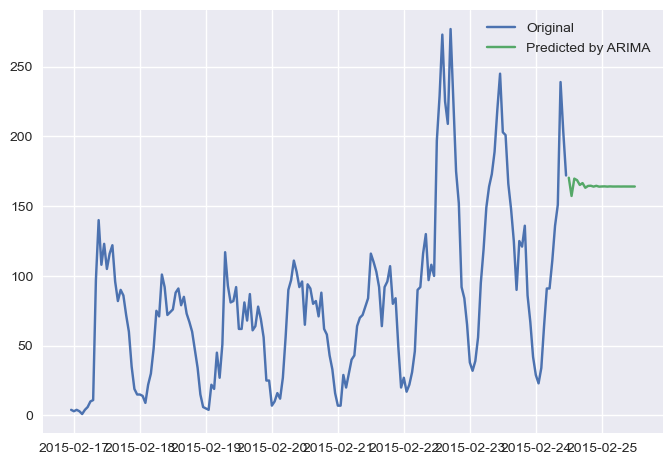

In [156]:
from statsmodels.tsa.arima.model import ARIMA

# ARIMA modeli oluşturma
model_arima = ARIMA(tweet_counts, order=(5,1,0))

# Modeli eğitme
model_fit_arima = model_arima.fit()

# Gelecek 24 saatlik tahminleri yapma
predictions_arima = model_fit_arima.predict(start=len(tweet_counts), end=len(tweet_counts)+24)

# Tahminleri çizdirme
plt.plot(tweet_counts, label='Original')
plt.plot(predictions_arima, label='Predicted by ARIMA')
plt.legend()
plt.show()


In [7]:
import pandas as pd
data = pd.read_csv('Tweets.csv',
                   index_col=[0],
                  parse_dates=[0])
data.head()

,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
tweet_id,,,,,,,,,,,,,,
570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 14640 entries, 570306133677760513 to 569587140490866689
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   airline_sentiment             14640 non-null  object 
 1   airline_sentiment_confidence  14640 non-null  float64
 2   negativereason                9178 non-null   object 
 3   negativereason_confidence     10522 non-null  float64
 4   airline                       14640 non-null  object 
 5   airline_sentiment_gold        40 non-null     object 
 6   name                          14640 non-null  object 
 7   negativereason_gold           32 non-null     object 
 8   retweet_count                 14640 non-null  int64  
 9   text                          14640 non-null  object 
 10  tweet_coord                   1019 non-null   object 
 11  tweet_created                 14640 non-null  object 
 12  tweet_location                

<Axes: xlabel='airline'>

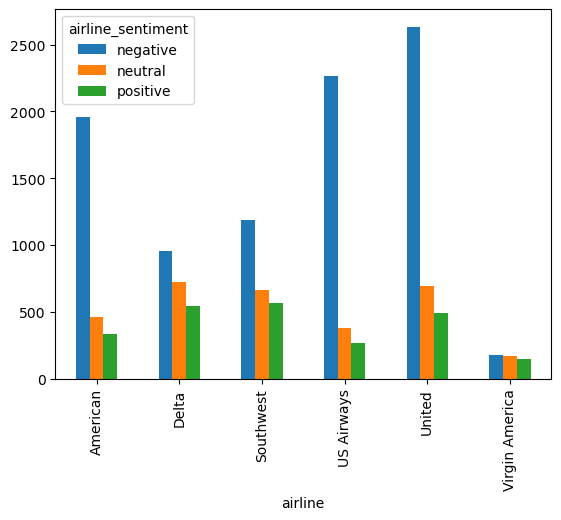

In [15]:
# Genel bilgi al
print(data.info())

# Hedef değişkenin (airline_sentiment) dağılımını kontrol edelim
print(data['airline_sentiment'].value_counts())

# Havayolu şirketlerine göre duygu durumlarını kontrol edelim
airline_sentiment = data.groupby(['airline', 'airline_sentiment']).airline_sentiment.count().unstack()
airline_sentiment.plot(kind='bar')


In [16]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report
from nltk.corpus import stopwords
import nltk
import re

nltk.download('stopwords')

def preprocess_text(text):
    # Remove non-alphabetic characters and convert to lower case
    text = re.sub('[^a-zA-Z]', ' ', text).lower()
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    text = ' '.join(word for word in text.split() if word not in stop_words)
    return text

# Preprocess text
data['clean_text'] = data['text'].apply(preprocess_text)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(data['clean_text'], data['airline_sentiment'], test_size=0.2, random_state=42)

# Create a pipeline for preprocessing and classification
pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', MultinomialNB())
])

# Train the model
pipeline.fit(X_train, y_train)

# Test the model
y_pred = pipeline.predict(X_test)

# Print the classification report
print(classification_report(y_test, y_pred))


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\dovle\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


              precision    recall  f1-score   support

    negative       0.69      0.99      0.81      1889
     neutral       0.76      0.16      0.26       580
    positive       0.94      0.18      0.30       459

    accuracy                           0.70      2928
   macro avg       0.80      0.44      0.46      2928
weighted avg       0.74      0.70      0.62      2928



In [17]:
data = pd.read_csv('Tweets.csv', index_col=['tweet_created'], parse_dates=['tweet_created'])
data.head()


,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_location,user_timezone
tweet_created,,,,,,,,,,,,,,
2015-02-24 11:35:52-08:00,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,NaN,Eastern Time (US & Canada)
2015-02-24 11:15:59-08:00,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,NaN,Pacific Time (US & Canada)
2015-02-24 11:15:48-08:00,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,Lets Play,Central Time (US & Canada)
2015-02-24 11:15:36-08:00,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,NaN,Pacific Time (US & Canada)
2015-02-24 11:14:45-08:00,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,NaN,Pacific Time (US & Canada)


In [7]:
data_sub = data[['tweet_created', 'airline_sentiment_confidence']]


In [11]:
print(data_sub) 


                   tweet_created  airline_sentiment_confidence
0      2015-02-24 11:35:52 -0800                        1.0000
1      2015-02-24 11:15:59 -0800                        0.3486
2      2015-02-24 11:15:48 -0800                        0.6837
3      2015-02-24 11:15:36 -0800                        1.0000
4      2015-02-24 11:14:45 -0800                        1.0000
...                          ...                           ...
14635  2015-02-22 12:01:01 -0800                        0.3487
14636  2015-02-22 11:59:46 -0800                        1.0000
14637  2015-02-22 11:59:15 -0800                        1.0000
14638  2015-02-22 11:59:02 -0800                        1.0000
14639  2015-02-22 11:58:51 -0800                        0.6771

[14640 rows x 2 columns]


In [12]:
import pandas as pd

# 'tweet_created' sütununu datetime formatına dönüştür
data['tweet_created'] = pd.to_datetime(data['tweet_created'])

# 'tweet_created' sütununu index olarak ata
data.set_index('tweet_created', inplace=True)

# Gün bazında yeniden örnekleme yap ve 'airline_sentiment_confidence' değerlerinin ortalamasını al
data_daily = data['airline_sentiment_confidence'].resample('D').mean()

print(data_daily)


tweet_created
2015-02-16 00:00:00-08:00    1.000000
2015-02-17 00:00:00-08:00    0.897708
2015-02-18 00:00:00-08:00    0.881135
2015-02-19 00:00:00-08:00    0.887186
2015-02-20 00:00:00-08:00    0.900146
2015-02-21 00:00:00-08:00    0.908164
2015-02-22 00:00:00-08:00    0.917293
2015-02-23 00:00:00-08:00    0.899582
2015-02-24 00:00:00-08:00    0.887632
Freq: D, Name: airline_sentiment_confidence, dtype: float64


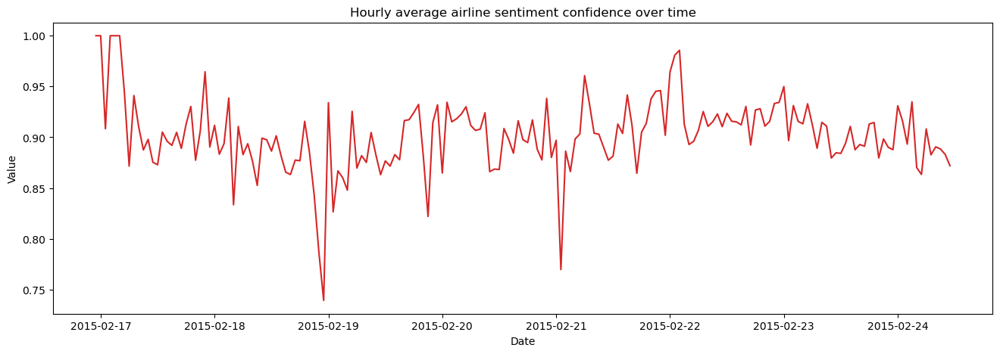

In [19]:
# Aylık bazda yeniden örnekleme yap ve 'airline_sentiment_confidence' değerlerinin ortalamasını al
data_monthly = data['airline_sentiment_confidence'].resample('H').mean()

# Grafiği çiz
plot_df(data_monthly, x=data_monthly.index, y=data_monthly, title='Hourly average airline sentiment confidence over time') 


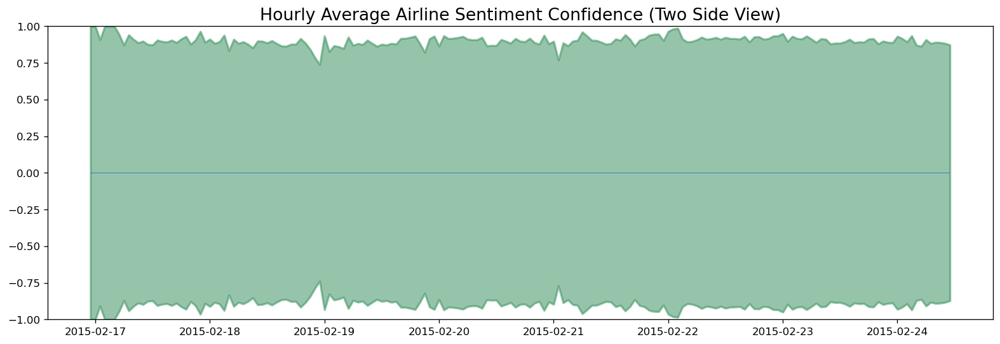

In [21]:
# Saatlik bazda yeniden örnekleme yap ve 'airline_sentiment_confidence' değerlerinin ortalamasını al
data_hourly = data['airline_sentiment_confidence'].resample('H').mean()

# Plot
fig, ax = plt.subplots(1, 1, figsize=(16,5), dpi= 120)
plt.fill_between(data_hourly.index, y1=data_hourly, y2=-data_hourly, alpha=0.5, linewidth=2, color='seagreen')
plt.ylim(-1, 1)  # 'airline_sentiment_confidence' değerleri 0 ile 1 arasında olduğundan, limitleri bu aralığa ayarlayın
plt.title('Hourly Average Airline Sentiment Confidence (Two Side View)', fontsize=16)
plt.hlines(y=0, xmin=np.min(data_hourly.index), xmax=np.max(data_hourly.index), linewidth=.5)
plt.show()


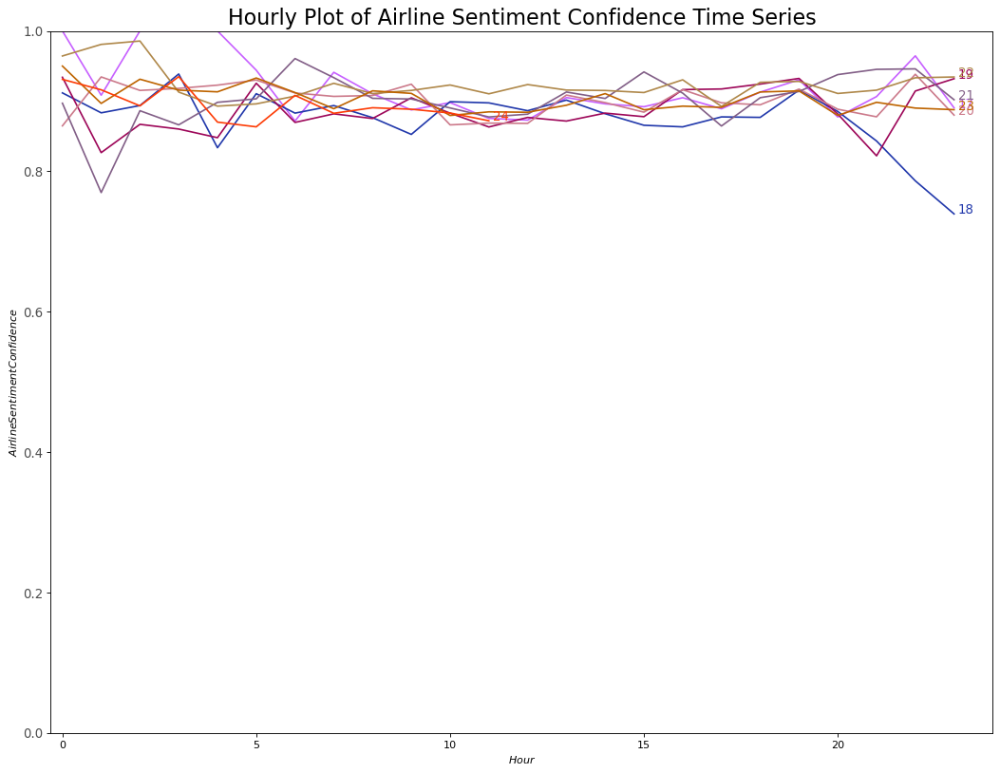

In [28]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

# Veri setini saatlik bazda yeniden örnekleme yap
df = data.resample('H').mean().reset_index()

# Saat ve gün bilgilerini ayrı sütunlarda sakla
df['hour'] = df['tweet_created'].dt.hour
df['day'] = df['tweet_created'].dt.day
days = df['day'].unique()

# Renkleri hazırla
np.random.seed(100)
mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(days), replace=False)

# Grafik çiz
plt.figure(figsize=(16,12), dpi= 80)
for i, d in enumerate(days):
    if i > 0:        
        plt.plot('hour', 'airline_sentiment_confidence', data=df.loc[df.day==d, :], color=mycolors[i], label=d)
        plt.text(df.loc[df.day==d, :].shape[0]-.9, df.loc[df.day==d, 'airline_sentiment_confidence'][-1:].values[0], d, fontsize=12, color=mycolors[i])

# Grafik süslemeleri
plt.gca().set(xlim=(-0.3, 24), ylim=(0, 1), ylabel='$Airline Sentiment Confidence$', xlabel='$Hour$')
plt.yticks(fontsize=12, alpha=.7)
plt.title("Hourly Plot of Airline Sentiment Confidence Time Series", fontsize=20)
plt.show()


In [32]:
# Check for duplicates
duplicates = data.index.duplicated()

# If there are duplicates, we can drop them
if duplicates.any():
    data = data[~duplicates]


In [35]:
# Eksik değerleri ortalama ile doldurma
data['airline_sentiment_confidence'] = data['airline_sentiment_confidence'].fillna(data['airline_sentiment_confidence'].mean())


In [36]:
# Eksik değerleri silme
data = data.dropna(subset=['airline_sentiment_confidence'])


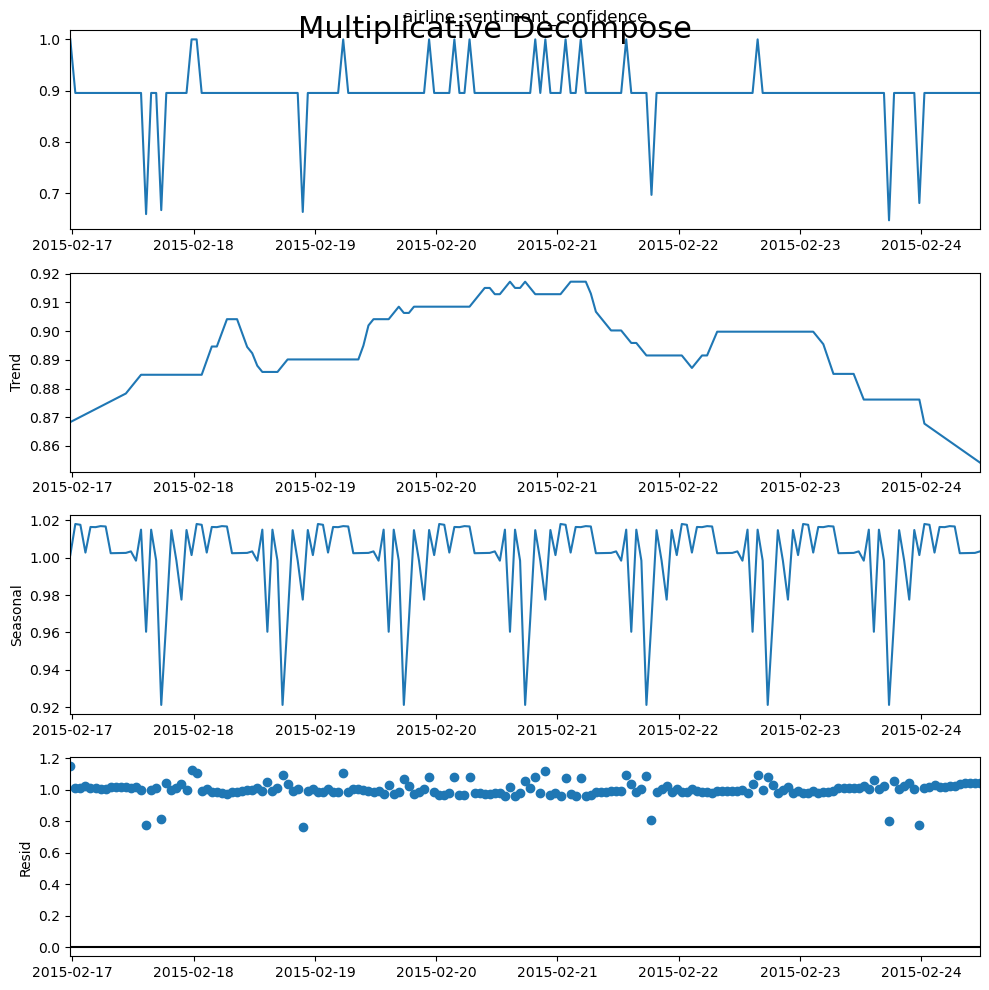

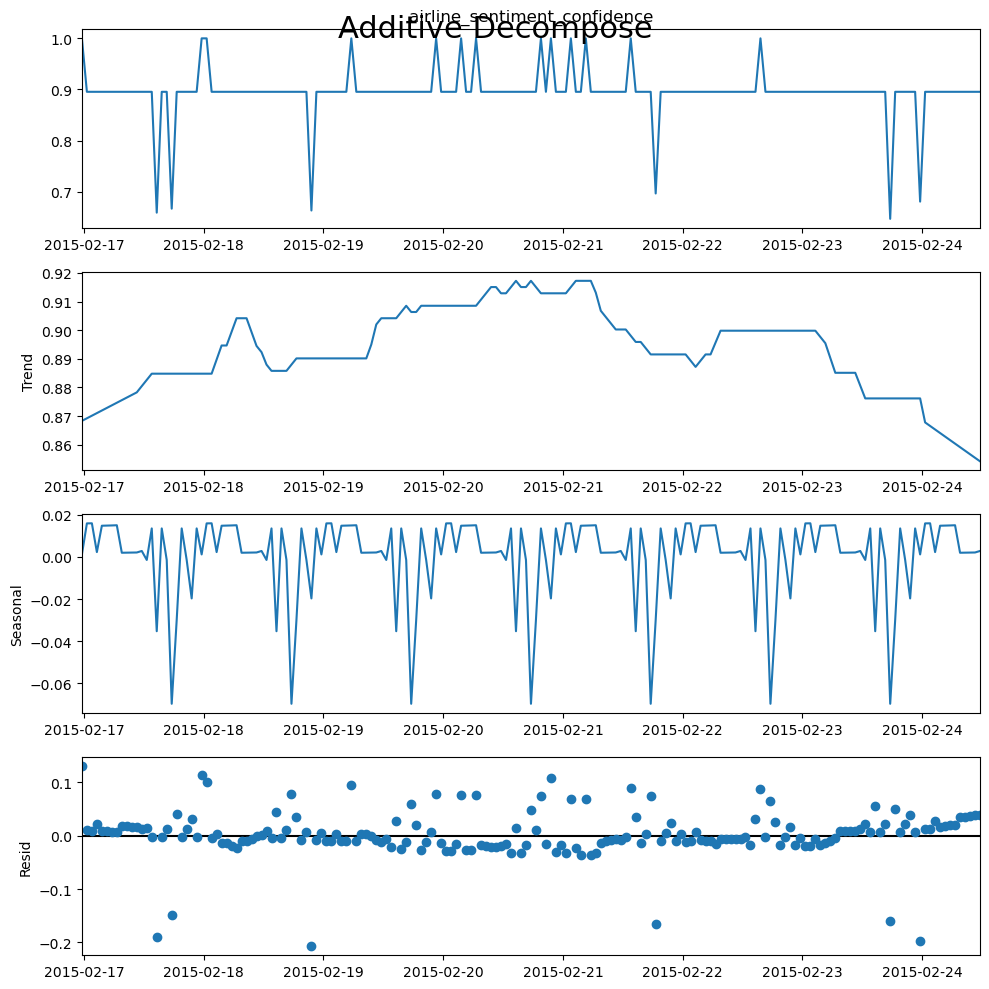

In [37]:
from statsmodels.tsa.seasonal import seasonal_decompose

# 'airline_sentiment_confidence' sütununu float'a dönüştür
data['airline_sentiment_confidence'] = data['airline_sentiment_confidence'].astype(float)

# Specify frequency of data
data = data.asfreq('H')

# Multiplicative Decomposition 
result_mul = seasonal_decompose(data['airline_sentiment_confidence'], model='multiplicative', extrapolate_trend='freq')

# Additive Decomposition
result_add = seasonal_decompose(data['airline_sentiment_confidence'], model='additive', extrapolate_trend='freq')

# Plot
plt.rcParams.update({'figure.figsize': (10,10)})
result_mul.plot().suptitle('Multiplicative Decompose', fontsize=22)
result_add.plot().suptitle('Additive Decompose', fontsize=22)
plt.show()


In [122]:
# Extract the Components ----
# Actual Values = Product of (Seasonal * Trend * Resid)
data_reconstructed = pd.concat([result_mul.seasonal, result_mul.trend, result_mul.resid, result_mul.observed], axis=1)
data_reconstructed.columns = ['seas', 'trend', 'resid', 'actual_values']
data_reconstructed.head()


,seas,trend,resid,actual_values
tweet_created,,,,
2015-02-16 23:36:05-08:00,1.001384,0.868299,1.150085,1.000000
2015-02-17 00:36:05-08:00,1.018032,0.869205,1.011950,0.895453
2015-02-17 01:36:05-08:00,1.017610,0.870111,1.011316,0.895453
2015-02-17 02:36:05-08:00,1.002734,0.871017,1.025251,0.895453
2015-02-17 03:36:05-08:00,1.016436,0.871923,1.010379,0.895453


In [132]:
from statsmodels.tsa.stattools import adfuller, kpss

# Ensure data is float type
data['airline_sentiment_confidence'] = data['airline_sentiment_confidence'].astype(float)

# ADF Test
result = adfuller(data['airline_sentiment_confidence'].values, autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

# KPSS Test
result = kpss(data['airline_sentiment_confidence'].values, regression='c')
print('\nKPSS Statistic: %f' % result[0])
print('p-value: %f' % result[1])
for key, value in result[3].items():
    print('Critial Values:')
    print(f'   {key}, {value}')


ADF Statistic: -6.429450903770159
p-value: 1.7117961391468233e-08
Critial Values:
   1%, -3.4674201432469816
Critial Values:
   5%, -2.877826051844538
Critial Values:
   10%, -2.575452082332012

KPSS Statistic: 0.213513
p-value: 0.100000
Critial Values:
   10%, 0.347
Critial Values:
   5%, 0.463
Critial Values:
   2.5%, 0.574
Critial Values:
   1%, 0.739


<Axes: title={'center': 'Random White Noise'}, xlabel='tweet_created'>

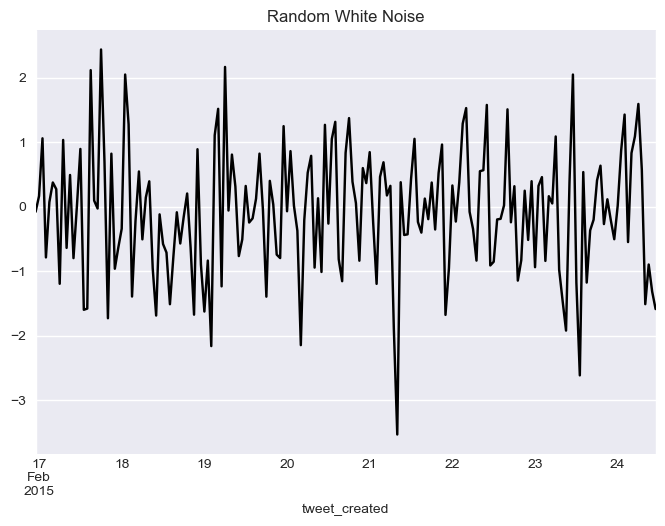

In [133]:
import numpy as np
import pandas as pd

randvals = np.random.randn(len(data))
pd.Series(randvals, index=data.index).plot(title='Random White Noise', color='k')


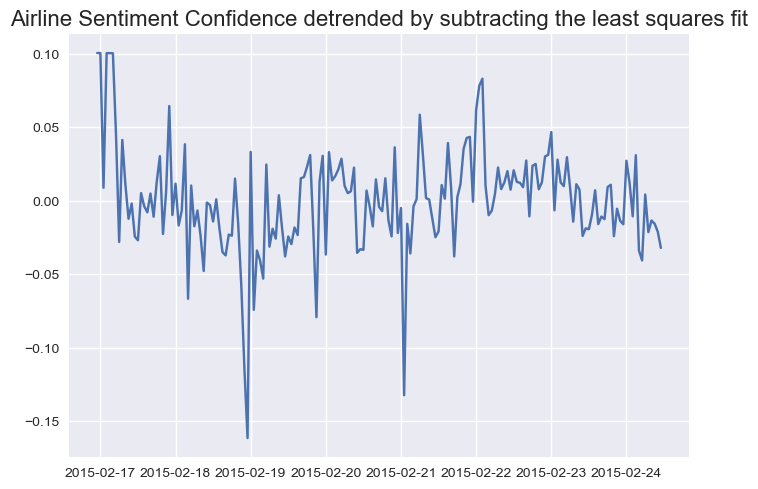

In [134]:
from scipy import signal
import matplotlib.pyplot as plt

# Using scipy: Subtract the line of best fit
detrended = signal.detrend(data['airline_sentiment_confidence'].values)
plt.plot(data.index, detrended)
plt.title('Airline Sentiment Confidence detrended by subtracting the least squares fit', fontsize=16)
plt.show()


In [141]:
data = data.loc[~data.index.duplicated(keep='first')]
data = data.resample('H').mean()
data = data.reset_index()
data['tweet_created'] += pd.to_timedelta(data.groupby('tweet_created').cumcount(), unit='ms')
data.set_index('tweet_created', inplace=True)


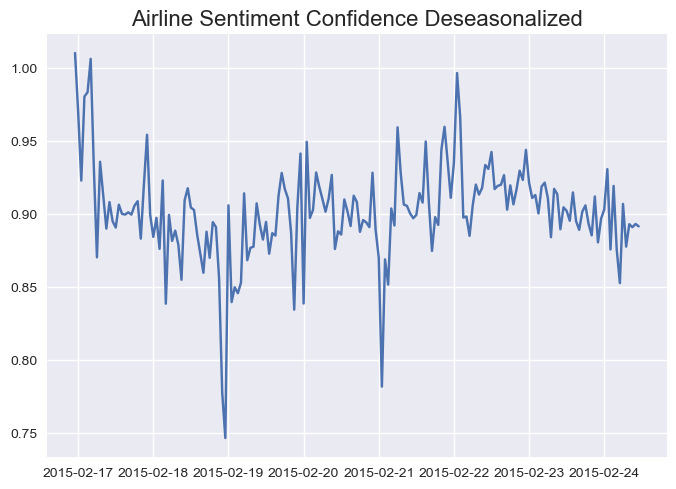

In [144]:
# Time Series Decomposition
result_mul = seasonal_decompose(data['airline_sentiment_confidence'].dropna(), model='multiplicative', extrapolate_trend='freq')

# Deseasonalize
deseasonalized = data.airline_sentiment_confidence.values / result_mul.seasonal

# Plot
plt.plot(deseasonalized)
plt.title('Airline Sentiment Confidence Deseasonalized', fontsize=16)
plt.show()


<Axes: xlabel='Lag', ylabel='Autocorrelation'>

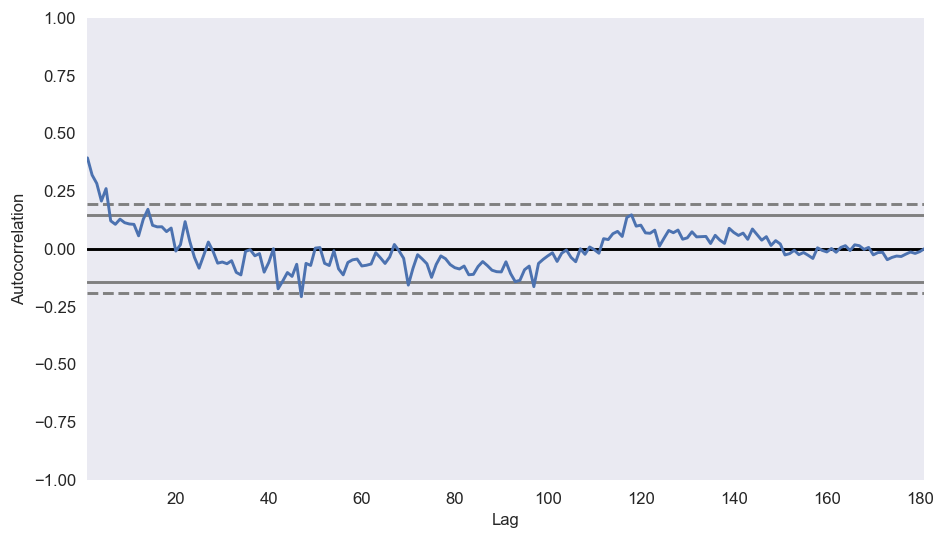

In [145]:
from pandas.plotting import autocorrelation_plot

# Draw Plot
plt.rcParams.update({'figure.figsize':(9,5), 'figure.dpi':120})
autocorrelation_plot(data['airline_sentiment_confidence'].dropna().tolist())


In [152]:
# 'tweet_created' sütununu tarih ve saat formatına dönüştürün
data['tweet_created'] = pd.to_datetime(data['tweet_created'])

# Tarih ve saat bilgisine göre veriyi yeniden örnekleme yapın
data.set_index('tweet_created', inplace=True)
data_resampled = data['airline_sentiment_confidence'].resample('D').mean()

# Eksik değerlerle başa çıkmak için interpolasyon yöntemlerini uygulayın
data_resampled = data_resampled.reset_index()
data_resampled['rownum'] = np.arange(data_resampled.shape[0])

data_resampled_nona = data_resampled.dropna(subset = ['airline_sentiment_confidence'])

# Linear Interpolation
f = interp1d(data_resampled_nona['rownum'], data_resampled_nona['airline_sentiment_confidence'])
data_resampled['linear_fill'] = f(data_resampled['rownum'])

# Cubic Interpolation
f2 = interp1d(data_resampled_nona['rownum'], data_resampled_nona['airline_sentiment_confidence'], kind='cubic')
data_resampled['cubic_fill'] = f2(data_resampled['rownum'])


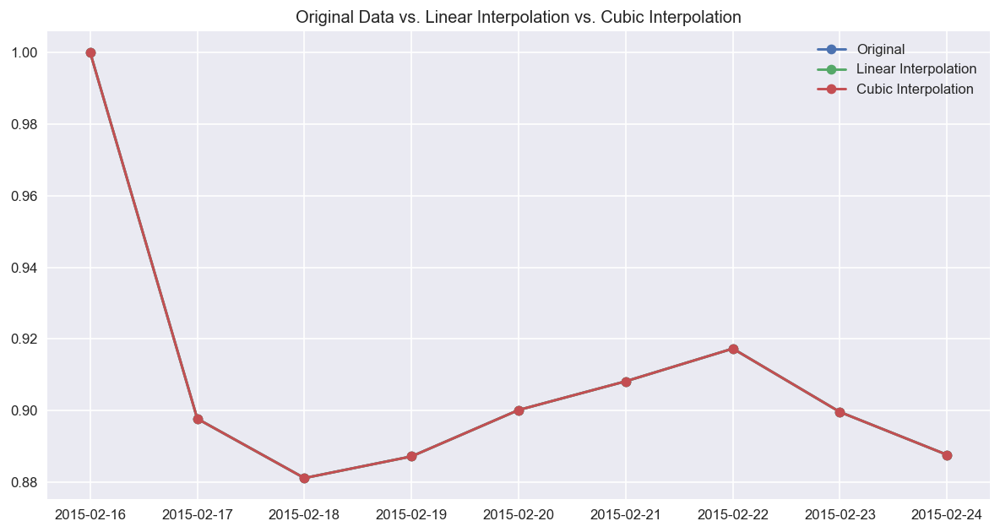

In [153]:
import matplotlib.pyplot as plt

# Original Data vs. Linear Interpolation vs. Cubic Interpolation
plt.figure(figsize=(12, 6))
plt.plot(data_resampled['tweet_created'], data_resampled['airline_sentiment_confidence'], label='Original', marker='o')
plt.plot(data_resampled['tweet_created'], data_resampled['linear_fill'], label='Linear Interpolation', marker='o')
plt.plot(data_resampled['tweet_created'], data_resampled['cubic_fill'], label='Cubic Interpolation', marker='o')
plt.legend(loc='best')
plt.title('Original Data vs. Linear Interpolation vs. Cubic Interpolation')
plt.show()


In [155]:
from sklearn.impute import KNNImputer

# KNN Imputer
imputer = KNNImputer(n_neighbors=5)

# Only select numeric columns
numeric_data = data.select_dtypes(include=[np.number])

# Perform KNN imputation
imputed = imputer.fit_transform(numeric_data)

# Convert back to DataFrame and reassign column names
data_imputed = pd.DataFrame(imputed, columns=numeric_data.columns)

# Check missing values
print(data_imputed.isnull().sum())


tweet_id                        0
airline_sentiment_confidence    0
negativereason_confidence       0
retweet_count                   0
dtype: int64


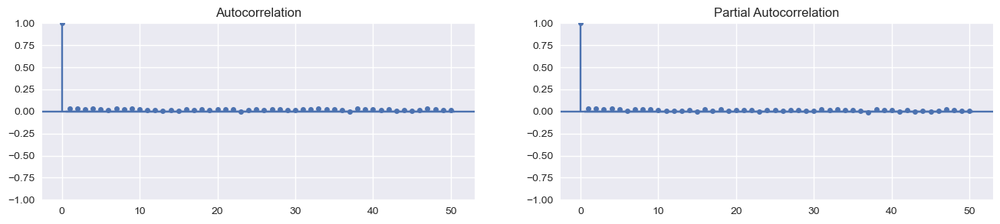

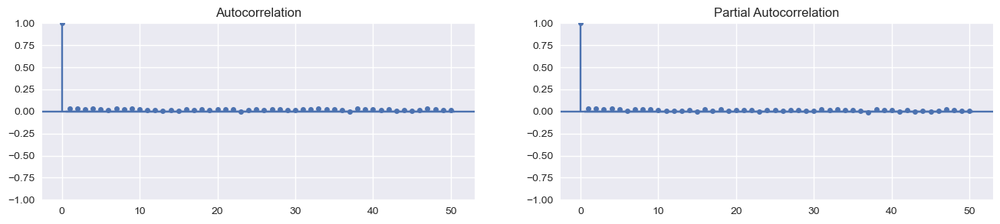

In [181]:
import pandas as pd
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Veri setini okuma
data = pd.read_csv('Tweets.csv')

# 'airline_sentiment_confidence' sütununu float tipine dönüştürme
data['airline_sentiment_confidence'] = data['airline_sentiment_confidence'].astype(float)

# ACF ve PACF'nin 50 gecikme için hesaplanması
# acf_50 = acf(data.airline_sentiment_confidence, nlags=50)
# pacf_50 = pacf(data.airline_sentiment_confidence, nlags=50)

# Plot oluşturma
fig, axes = plt.subplots(1,2,figsize=(16,3), dpi= 100)
plot_acf(data.airline_sentiment_confidence.tolist(), lags=50, ax=axes[0])
plot_pacf(data.airline_sentiment_confidence.tolist(), lags=50, ax=axes[1])


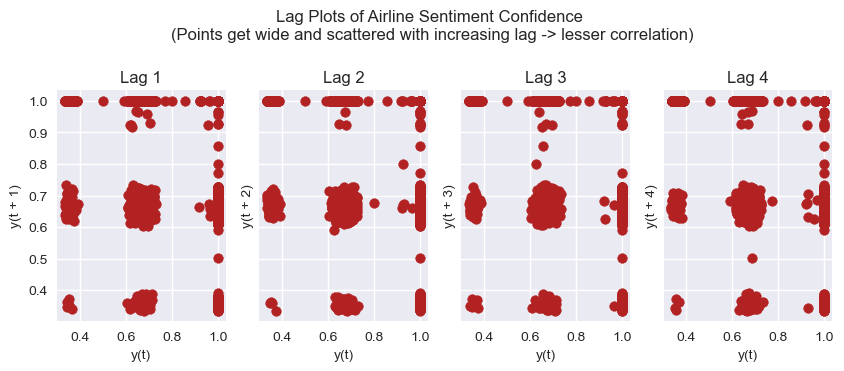

In [182]:
import pandas as pd
from pandas.plotting import lag_plot
import matplotlib.pyplot as plt

# Veri setini okuma
data = pd.read_csv('Tweets.csv')

# 'airline_sentiment_confidence' sütununu float tipine dönüştürme
data['airline_sentiment_confidence'] = data['airline_sentiment_confidence'].astype(float)

# Plot
fig, axes = plt.subplots(1, 4, figsize=(10,3), sharex=True, sharey=True, dpi=100)
for i, ax in enumerate(axes.flatten()[:4]):
    lag_plot(data.airline_sentiment_confidence, lag=i+1, ax=ax, c='firebrick')
    ax.set_title('Lag ' + str(i+1))

fig.suptitle('Lag Plots of Airline Sentiment Confidence \n(Points get wide and scattered with increasing lag -> lesser correlation)\n', y=1.15)    
plt.show()


In [183]:
import pandas as pd
import numpy as np

# Veri setini okuma
data = pd.read_csv('Tweets.csv')

# 'airline_sentiment_confidence' sütununu float tipine dönüştürme
data['airline_sentiment_confidence'] = data['airline_sentiment_confidence'].astype(float)
data['negativereason_confidence'] = data['negativereason_confidence'].astype(float)
data['retweet_count'] = data['retweet_count'].astype(float)
def ApEn(U, m, r):
    """Compute Aproximate entropy"""
    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])

    def _phi(m):
        x = [[U[j] for j in range(i, i + m - 1 + 1)] for i in range(N - m + 1)]
        C = [len([1 for x_j in x if _maxdist(x_i, x_j) <= r]) / (N - m + 1.0) for x_i in x]
        return (N - m + 1.0)**(-1) * sum(np.log(C))

    N = len(U)
    return abs(_phi(m+1) - _phi(m))

print(ApEn(data.airline_sentiment_confidence.values, m=2, r=0.2*np.std(data.airline_sentiment_confidence.values)))  


0.7649615764147555


In [184]:
import pandas as pd
import numpy as np

# Veri setini okuma
data = pd.read_csv('Tweets.csv')

# 'airline_sentiment_confidence' sütununu float tipine dönüştürme
data['airline_sentiment_confidence'] = data['airline_sentiment_confidence'].astype(float)

def SampEn(U, m, r):
    """Compute Sample entropy"""
    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])

    def _phi(m):
        x = [[U[j] for j in range(i, i + m - 1 + 1)] for i in range(N - m + 1)]
        C = [len([1 for j in range(len(x)) if i != j and _maxdist(x[i], x[j]) <= r]) for i in range(len(x))]
        return sum(C)

    N = len(U)
    return -np.log(_phi(m+1) / _phi(m))

print(SampEn(data.airline_sentiment_confidence.values, m=2, r=0.2*np.std(data.airline_sentiment_confidence.values)))  


0.5514452863032149


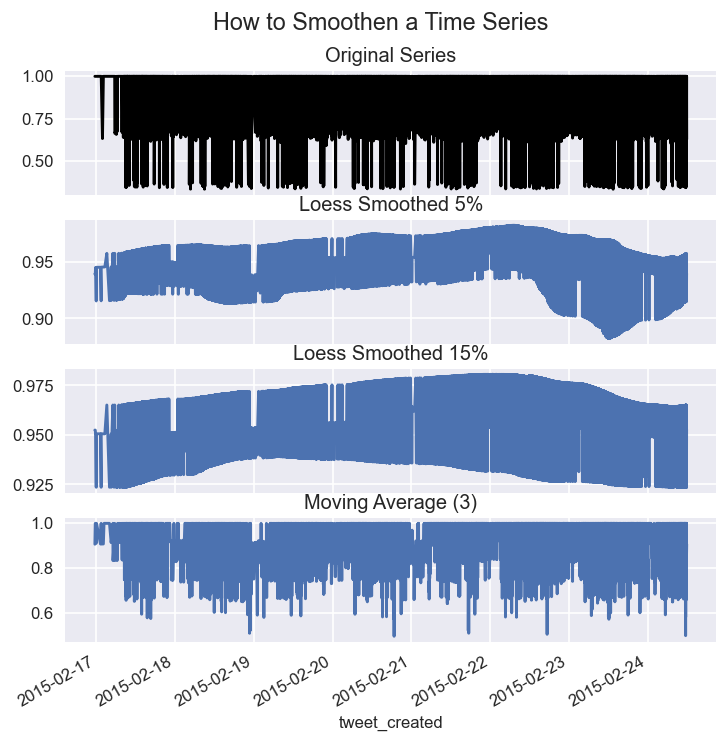

In [187]:
from statsmodels.nonparametric.smoothers_lowess import lowess
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams.update({'xtick.bottom' : False, 'axes.titlepad':5})

# Import
df_orig = pd.read_csv('Tweets.csv', parse_dates=['tweet_created'], index_col='tweet_created')

# 1. Moving Average
df_ma = df_orig['airline_sentiment_confidence'].rolling(3, center=True, closed='both').mean()

# 2. Loess Smoothing (5% and 15%)
df_loess_5 = pd.DataFrame(lowess(df_orig['airline_sentiment_confidence'], np.arange(len(df_orig['airline_sentiment_confidence'])), frac=0.05)[:, 1], index=df_orig.index, columns=['airline_sentiment_confidence'])
df_loess_15 = pd.DataFrame(lowess(df_orig['airline_sentiment_confidence'], np.arange(len(df_orig['airline_sentiment_confidence'])), frac=0.15)[:, 1], index=df_orig.index, columns=['airline_sentiment_confidence'])

# Plot
fig, axes = plt.subplots(4,1, figsize=(7, 7), sharex=True, dpi=120)
df_orig['airline_sentiment_confidence'].plot(ax=axes[0], color='k', title='Original Series')
df_loess_5['airline_sentiment_confidence'].plot(ax=axes[1], title='Loess Smoothed 5%')
df_loess_15['airline_sentiment_confidence'].plot(ax=axes[2], title='Loess Smoothed 15%')
df_ma.plot(ax=axes[3], title='Moving Average (3)')
fig.suptitle('How to Smoothen a Time Series', y=0.95, fontsize=14)
plt.show()


In [188]:
from statsmodels.tsa.stattools import grangercausalitytests
import pandas as pd

# Data import
df = pd.read_csv('Tweets.csv', parse_dates=['tweet_created'])

# Create 'month' column based on 'tweet_created' column
df['month'] = df.tweet_created.dt.month

# Select only relevant columns
df = df[['airline_sentiment_confidence', 'retweet_count', 'month']]

# Drop rows with missing values
df = df.dropna()

# Ensure the variables are of type float for the Granger Causality test
df[['airline_sentiment_confidence', 'retweet_count']] = df[['airline_sentiment_confidence', 'retweet_count']].astype(float)

# Apply Granger Causality test
grangercausalitytests(df[['airline_sentiment_confidence', 'retweet_count']], maxlag=2)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2700  , p=0.6033  , df_denom=14636, df_num=1
ssr based chi2 test:   chi2=0.2701  , p=0.6033  , df=1
likelihood ratio test: chi2=0.2700  , p=0.6033  , df=1
parameter F test:         F=0.2700  , p=0.6033  , df_denom=14636, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6823  , p=0.5055  , df_denom=14633, df_num=2
ssr based chi2 test:   chi2=1.3651  , p=0.5053  , df=2
likelihood ratio test: chi2=1.3650  , p=0.5053  , df=2
parameter F test:         F=0.6823  , p=0.5055  , df_denom=14633, df_num=2


{1: ({'ssr_ftest': (0.26999529465238, 0.6033427865642048, 14636.0, 1),
   'ssr_chi2test': (0.27005063667779383, 0.6032978068104438, 1),
   'lrtest': (0.27004814585961867, 0.6032994774778903, 1),
   'params_ftest': (0.2699952946604398, 0.6033427865598444, 14636.0, 1.0)},
   array([[0., 1., 0.]])]),
 2: ({'ssr_ftest': (0.6823055637081693, 0.5054663799566629, 14633.0, 2),
   'ssr_chi2test': (1.3650774060767008, 0.5053324734637057, 2),
   'lrtest': (1.36501375939406, 0.5053485550873732, 2),
   'params_ftest': (0.6823055637099301, 0.5054663799558421, 14633.0, 2.0)},
   array([[0., 0., 1., 0., 0.],
          [0., 0., 0., 1., 0.]])])}

<Axes: xlabel='airline_sentiment_confidence', ylabel='retweet_count'>

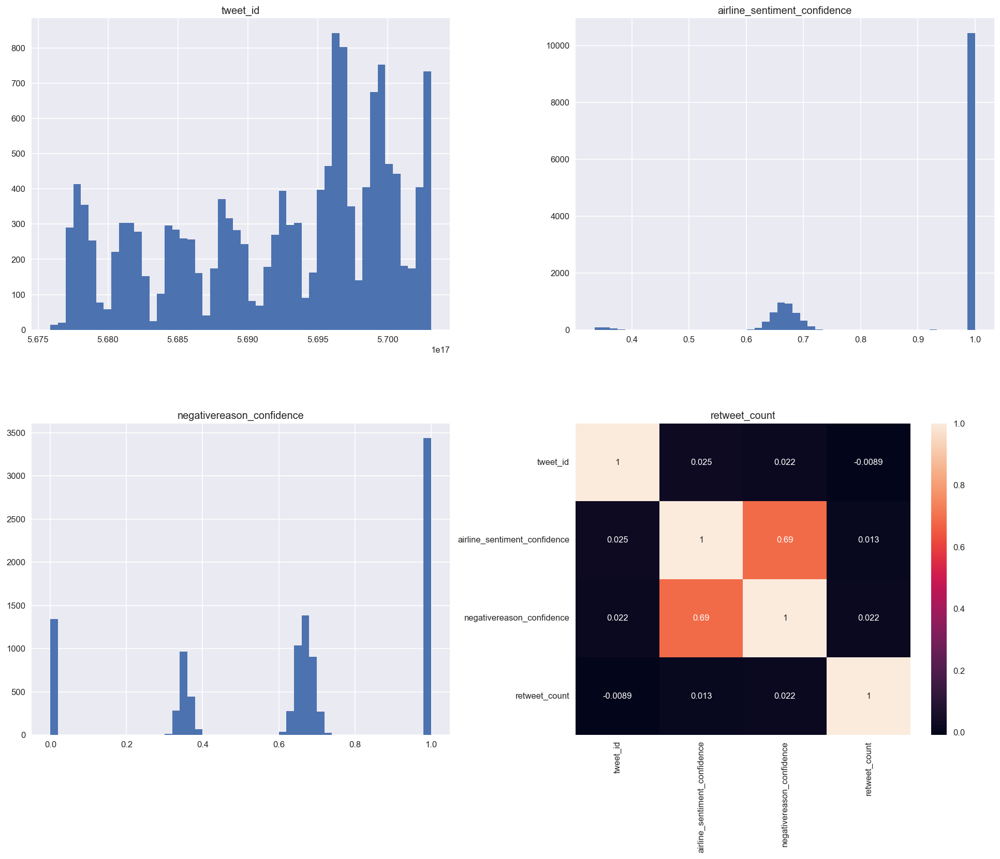

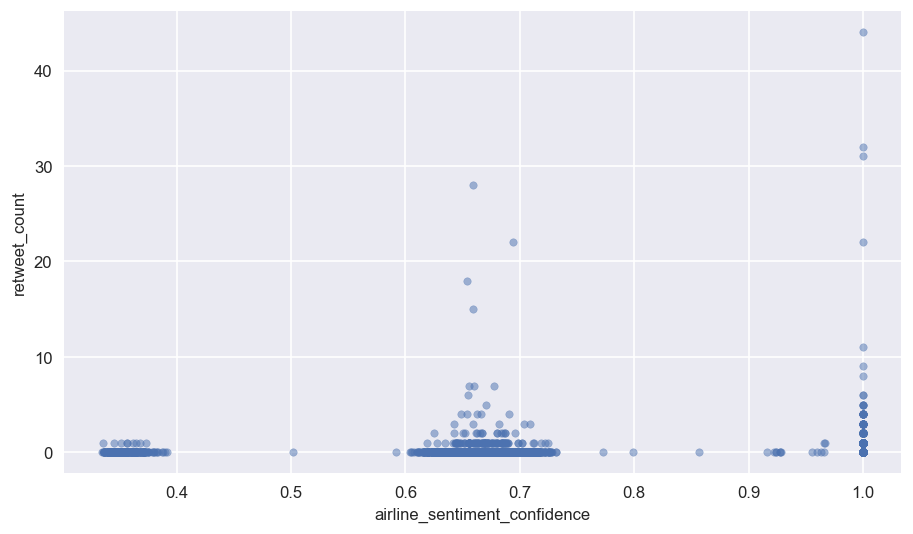

In [190]:
import seaborn as sns

# check the distribution of each variable
data.hist(bins=50, figsize=(20,15))

# check the correlation between variables
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True)

# let's say you want to see how 'airline_sentiment_confidence' is related to 'retweet_count'
data.plot(kind="scatter", x="airline_sentiment_confidence", y="retweet_count", alpha=0.5)


### MongoDB

In [1]:
!pip install pymongo

In [13]:
from pymongo import MongoClient
import pandas as pd

# MongoDB client oluşturun
client = MongoClient('mongodb://localhost:27017/')

# Veritabanınızı ve koleksiyonunuzu seçin
db = client['mydatabase']
collection = db['mycollection']

# Veriyi çekin ve bir pandas DataFrame'ine 
data = list(collection.find())
df = pd.DataFrame(data)


In [14]:
print(df.columns)


Index(['_id', 'tweet_id', 'airline_sentiment', 'airline_sentiment_confidence',
       'negativereason', 'negativereason_confidence', 'airline',
       'airline_sentiment_gold', 'name', 'negativereason_gold',
       'retweet_count', 'text', 'tweet_coord', 'tweet_created',
       'tweet_location', 'user_timezone'],
      dtype='object')


In [15]:
from pymongo import MongoClient

client = MongoClient('mongodb://localhost:27017/')

db = client['mydatabase']
collection = db['mycollection']

pipeline = [
    {"$match": {"airline": "Delta"}},  # "Delta" ile değiştirilebilir
    {"$group": {"_id": "$name", "count": {"$sum": 1}}},
    {"$sort": {"count": -1}},
    {"$limit": 5}
]

result = collection.aggregate(pipeline)

for document in result:
    print(document)


{'_id': 'JetBlueNews', 'count': 248}
{'_id': 'kbosspotter', 'count': 128}
{'_id': 'ThatJasonEaton', 'count': 72}
{'_id': 'SMHillman', 'count': 68}
{'_id': 'arthurhasher', 'count': 64}


In [18]:
from pymongo import MongoClient
import pandas as pd

# MongoDB client oluşturun
client = MongoClient('mongodb://localhost:27017/')

# Veritabanınızı ve koleksiyonunuzu seçin
db = client['mydatabase']
collection = db['mycollection']

# CSV dosyasını okuyun
data = pd.read_csv('Tweets.csv')

# Pandas DataFrame'ini bir dizi sözlük olarak dönüştürün
data_dict = data.to_dict("records")

# Veriyi MongoDB koleksiyonuna yerleştirin
collection.insert_many(data_dict)


In [19]:
pipeline = [
    {"$group": {"_id": "$airline", "count": {"$sum": 1}}},
    {"$sort": {"count": -1}}
]

result = collection.aggregate(pipeline)

for document in result:
    print(document)


{'_id': 'United', 'count': 15288}
{'_id': 'US Airways', 'count': 11652}
{'_id': 'American', 'count': 11036}
{'_id': 'Southwest', 'count': 9680}
{'_id': 'Delta', 'count': 8888}
{'_id': 'Virgin America', 'count': 2016}


In [20]:
pipeline = [
    {"$group": {"_id": {"airline": "$airline", "sentiment": "$airline_sentiment"}, "count": {"$sum": 1}}},
    {"$sort": {"count": -1}}
]

result = collection.aggregate(pipeline)

for document in result:
    print(document)

    

{'_id': {'airline': 'United', 'sentiment': 'negative'}, 'count': 10532}
{'_id': {'airline': 'US Airways', 'sentiment': 'negative'}, 'count': 9052}
{'_id': {'airline': 'American', 'sentiment': 'negative'}, 'count': 7840}
{'_id': {'airline': 'Southwest', 'sentiment': 'negative'}, 'count': 4744}
{'_id': {'airline': 'Delta', 'sentiment': 'negative'}, 'count': 3820}
{'_id': {'airline': 'Delta', 'sentiment': 'neutral'}, 'count': 2892}
{'_id': {'airline': 'United', 'sentiment': 'neutral'}, 'count': 2788}
{'_id': {'airline': 'Southwest', 'sentiment': 'neutral'}, 'count': 2656}
{'_id': {'airline': 'Southwest', 'sentiment': 'positive'}, 'count': 2280}
{'_id': {'airline': 'Delta', 'sentiment': 'positive'}, 'count': 2176}
{'_id': {'airline': 'United', 'sentiment': 'positive'}, 'count': 1968}
{'_id': {'airline': 'American', 'sentiment': 'neutral'}, 'count': 1852}
{'_id': {'airline': 'US Airways', 'sentiment': 'neutral'}, 'count': 1524}
{'_id': {'airline': 'American', 'sentiment': 'positive'}, 'coun

In [21]:
pipeline = [
    {"$match": {"airline_sentiment": "negative"}},
    {"$group": {"_id": "$negativereason", "count": {"$sum": 1}}},
    {"$sort": {"count": -1}}
]

result = collection.aggregate(pipeline)

for document in result:
    print(document)


{'_id': 'Customer Service Issue', 'count': 11640}
{'_id': 'Late Flight', 'count': 6660}
{'_id': "Can't Tell", 'count': 4760}
{'_id': 'Cancelled Flight', 'count': 3388}
{'_id': 'Lost Luggage', 'count': 2896}
{'_id': 'Bad Flight', 'count': 2320}
{'_id': 'Flight Booking Problems', 'count': 2116}
{'_id': 'Flight Attendant Complaints', 'count': 1924}
{'_id': 'longlines', 'count': 712}
{'_id': 'Damaged Luggage', 'count': 296}


In [23]:
data = list(collection.find())
df = pd.DataFrame(data)
print(df.describe().T)


                                count          mean           std  \
tweet_id                      58560.0  5.692184e+17  7.790912e+14   
airline_sentiment_confidence  58560.0  9.001689e-01  1.628258e-01   
negativereason_confidence     42088.0  6.382983e-01  3.304280e-01   
retweet_count                 58560.0  8.265027e-02  7.457591e-01   

                                       min           25%           50%  \
tweet_id                      5.675883e+17  5.685592e+17  5.694779e+17   
airline_sentiment_confidence  3.350000e-01  6.923000e-01  1.000000e+00   
negativereason_confidence     0.000000e+00  3.606000e-01  6.706000e-01   
retweet_count                 0.000000e+00  0.000000e+00  0.000000e+00   

                                       75%           max  
tweet_id                      5.698905e+17  5.703106e+17  
airline_sentiment_confidence  1.000000e+00  1.000000e+00  
negativereason_confidence     1.000000e+00  1.000000e+00  
retweet_count                 0.000000e+00  4.4

In [24]:
from pymongo import MongoClient
import plotly.graph_objects as go

# MongoDB client oluşturun
client = MongoClient('mongodb://localhost:27017/')

# Veritabanınızı ve koleksiyonunuzu seçin
db = client['mydatabase']
collection = db['mycollection']

# Havayolu hakkında negatif tweetlerin sayısını bul
pipeline = [
    {"$match": {"airline_sentiment": "negative"}},
    {"$group": {"_id": "$airline", "total_negative_tweets": {"$sum": 1}}},
    {"$sort": {"total_negative_tweets": -1}}
]

result = collection.aggregate(pipeline)

# Sonuçları listeye dönüştürün
airlines = []
negative_tweets = []
for document in result:
    airlines.append(document['_id'])
    negative_tweets.append(document['total_negative_tweets'])

# Sonuçları Plotly ile görselleştirin
fig = go.Figure(data=[
    go.Bar(name='Total Negative Tweets', x=airlines, y=negative_tweets)
])

fig.update_layout({
    'plot_bgcolor': 'rgba(0, 0, 0, 0)',
    'paper_bgcolor': 'rgba(0, 0, 0, 0)',
    'title': 'Airlines with the Most Number of Negative Tweets'
})

fig.show()


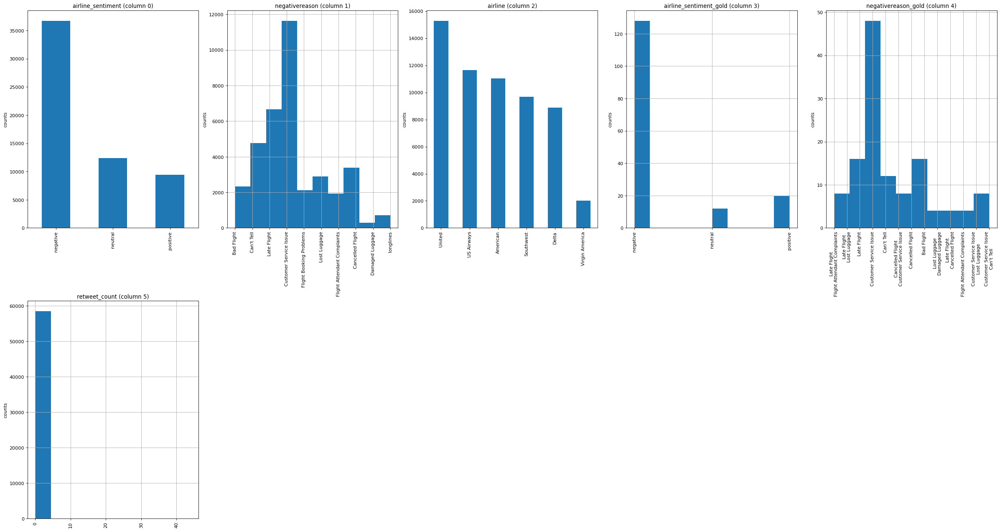

In [27]:
from pymongo import MongoClient
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Fonksiyonu tanımlayın
def plot_per_column_distribution(df, n_graph_shown, n_graph_per_row):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] 
    n_row, n_col = df.shape
    column_names = list(df)
    n_graph_row = (n_col + n_graph_per_row - 1) // n_graph_per_row
    plt.figure(num = None, figsize = (6 * n_graph_per_row, 8 * n_graph_row), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(n_col, n_graph_shown)):
        plt.subplot(n_graph_row, n_graph_per_row, i + 1)
        column_df = df.iloc[:, i]
        if (not np.issubdtype(type(column_df.iloc[0]), np.number)):
            value_counts = column_df.value_counts()
            value_counts.plot.bar()
        else:
            column_df.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{column_names[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()

# MongoDB client oluşturun
client = MongoClient('mongodb://localhost:27017/')

# Veritabanınızı ve koleksiyonunuzu seçin
db = client['mydatabase']
collection = db['mycollection']

# Veriyi çekin ve bir pandas DataFrame'ine çevirin
data = list(collection.find())
df = pd.DataFrame(data)

# Fonksiyonu çağırın
plot_per_column_distribution(df, 10, 5)


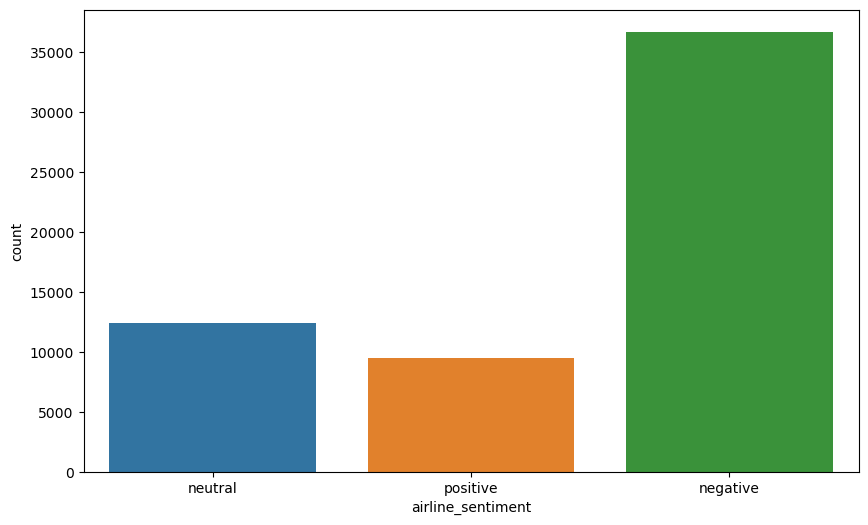

In [28]:
from pymongo import MongoClient
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# MongoDB client oluşturun
client = MongoClient('mongodb://localhost:27017/')

# Veritabanınızı ve koleksiyonunuzu seçin
db = client['mydatabase']
collection = db['mycollection']

# Veriyi çekin ve bir pandas DataFrame'ine çevirin
data = list(collection.find())
df = pd.DataFrame(data)

# seaborn countplot ile görselleştirme yapın
plt.figure(figsize=(10, 6))
sns.countplot(x="airline_sentiment", data=df)
plt.show()


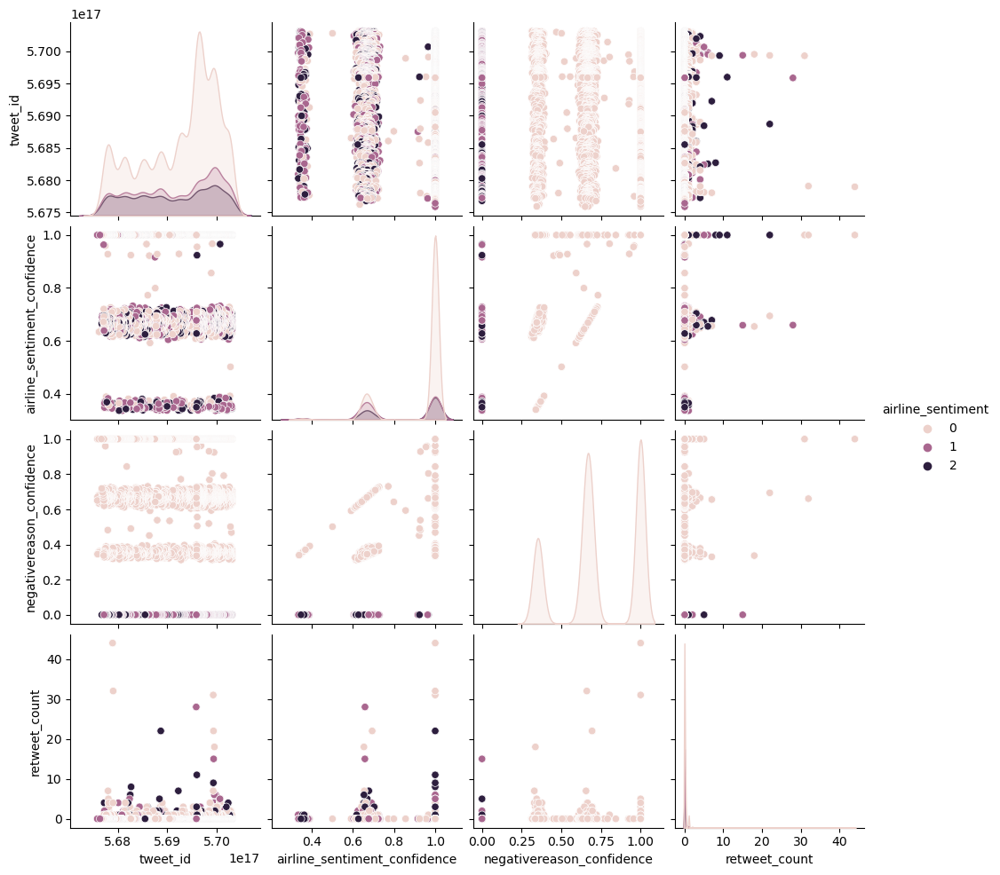

In [31]:
from sklearn.preprocessing import LabelEncoder

# Yeni bir LabelEncoder nesnesi oluşturun
encoder = LabelEncoder()

# 'airline_sentiment' sütununu kodlayın
df['airline_sentiment'] = encoder.fit_transform(df['airline_sentiment'])

# Şimdi pairplot oluşturabilirsiniz
sns.pairplot(df, hue='airline_sentiment')
plt.show()


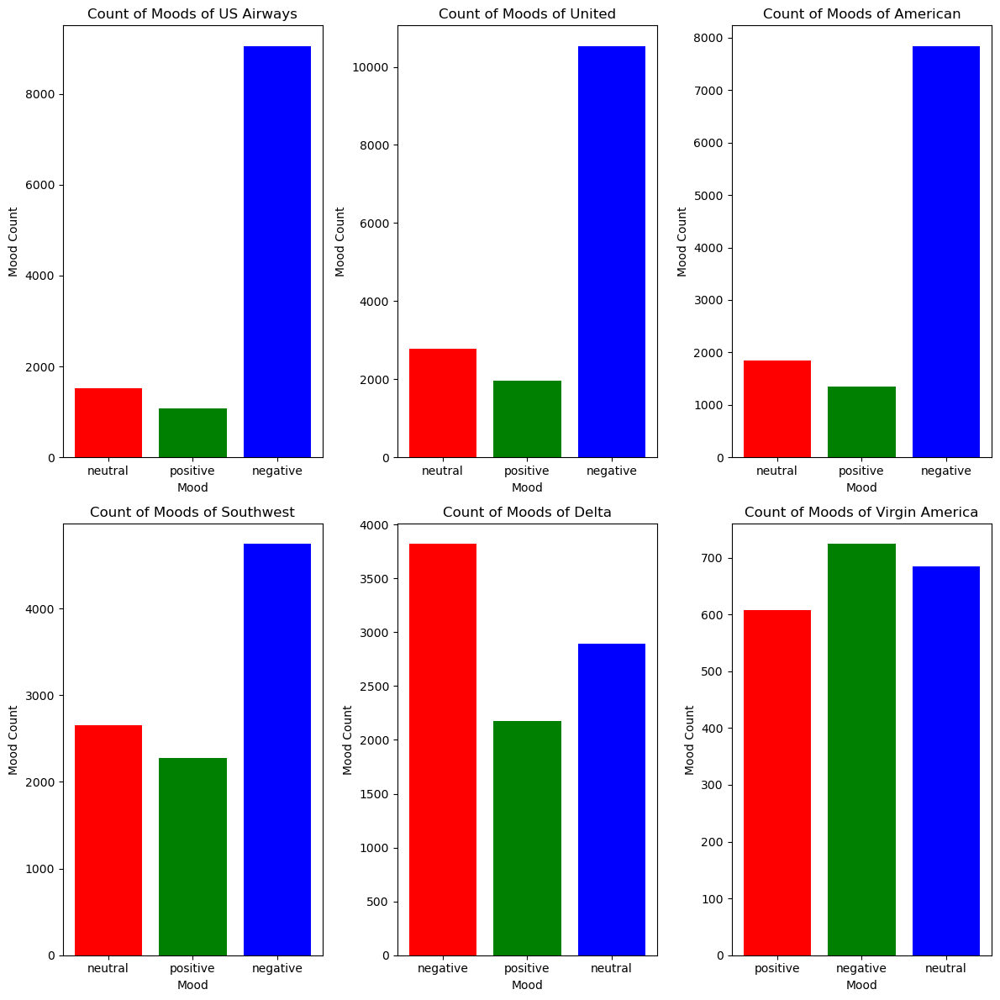

In [32]:
from pymongo import MongoClient
import matplotlib.pyplot as plt

# MongoDB client oluşturun
client = MongoClient('mongodb://localhost:27017/')

# Veritabanınızı ve koleksiyonunuzu seçin
db = client['mydatabase']
collection = db['mycollection']

# Havayolları listesi
airlines = ['US Airways', 'United', 'American', 'Southwest', 'Delta', 'Virgin America']

fig, axs = plt.subplots(2, 3, figsize=(12, 12))

for i, airline in enumerate(airlines):
    # Her havayolu için duygu sayısını hesapla
    sentiment_counts = collection.aggregate([
        {'$match': {'airline': airline}},
        {'$group': {'_id': '$airline_sentiment', 'count': {'$sum': 1}}}
    ])

    # Sonuçları bir Python sözlüğüne dönüştürün
    results = {doc['_id']: doc['count'] for doc in sentiment_counts}

    # Sonuçları bir çubuk grafiğinde çizdirin
    ax = axs[i // 3, i % 3]
    ax.bar(results.keys(), results.values(), color=['red', 'green', 'blue'])
    ax.set_ylabel('Mood Count')
    ax.set_xlabel('Mood')
    ax.set_title('Count of Moods of ' + airline)

plt.tight_layout()
plt.show()


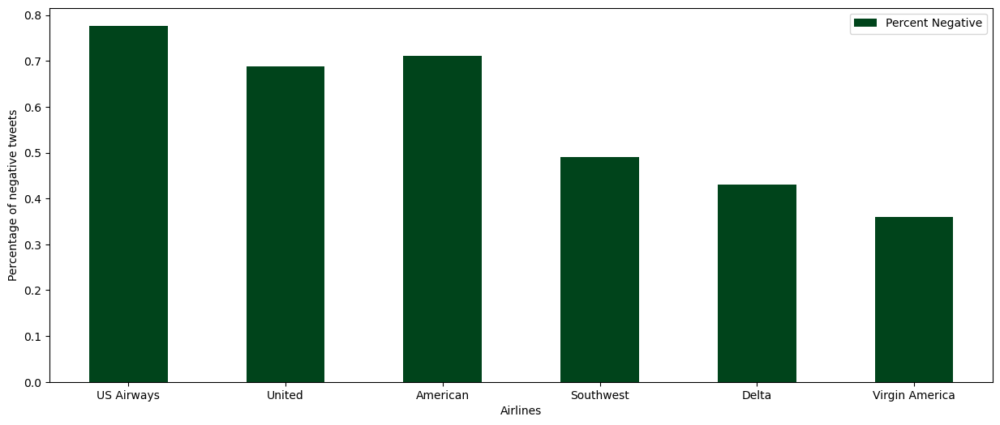

In [33]:
from pymongo import MongoClient
import matplotlib.pyplot as plt
import pandas as pd

# MongoDB client oluşturun
client = MongoClient('mongodb://localhost:27017/')

# Veritabanınızı ve koleksiyonunuzu seçin
db = client['mydatabase']
collection = db['mycollection']

# Havayolları listesi
airlines = ['US Airways', 'United', 'American', 'Southwest', 'Delta', 'Virgin America']

# Sonuçları bir sözlükte saklayın
results = {}

for airline in airlines:
    # Her havayolu için toplam ve negatif tweet sayısını bulun
    total_tweets = collection.count_documents({'airline': airline})
    negative_tweets = collection.count_documents({'airline': airline, 'airline_sentiment': 'negative'})

    # Negatif tweet yüzdesini hesaplayın ve sonuçları sözlüğe ekleyin
    results[airline] = negative_tweets / total_tweets

# Sonuçları bir pandas DataFrame'e dönüştürün
perc = pd.DataFrame.from_dict(results, orient='index', columns=['Percent Negative'])

# DataFrame'i çizdirin
ax = perc.plot(kind='bar', rot=0, colormap='Greens_r', figsize=(15,6))
ax.set_xlabel('Airlines')
ax.set_ylabel('Percentage of negative tweets')
plt.show()


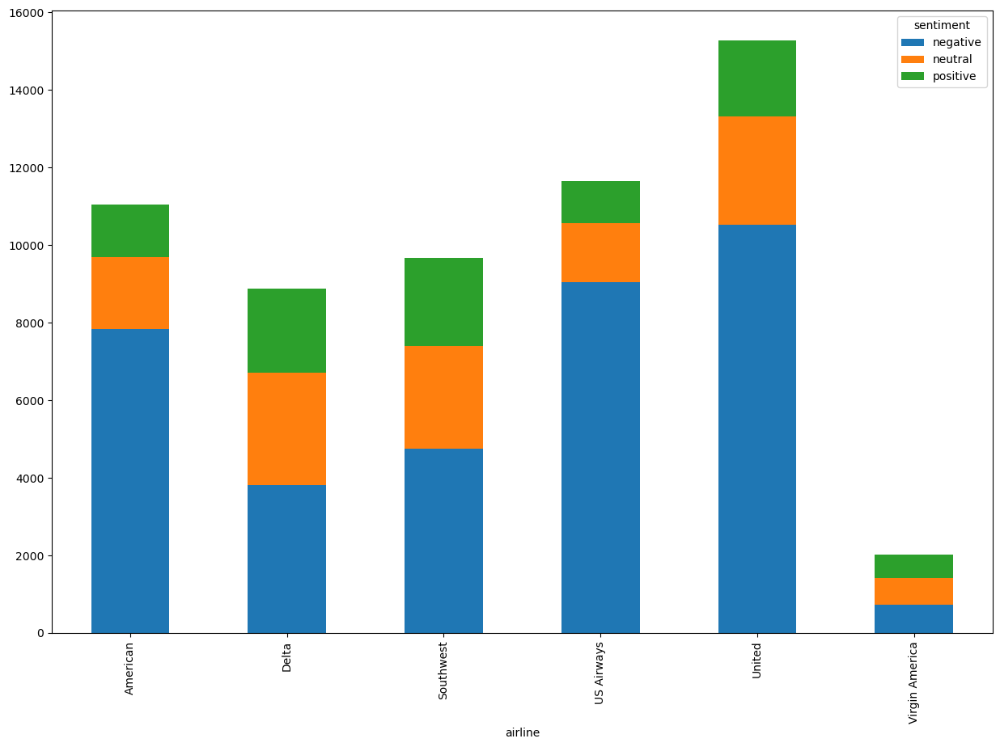

In [34]:
from pymongo import MongoClient
import pandas as pd
import matplotlib.pyplot as plt

# MongoDB client
client = MongoClient('mongodb://localhost:27017/')

# Select your database and collection
db = client['mydatabase']
collection = db['mycollection']

# Aggregation pipeline
pipeline = [
    {'$group': {'_id': {'airline': '$airline', 'sentiment': '$airline_sentiment'}, 'count': {'$sum': 1}}},
    {'$sort': {'count': -1}}
]

# Run aggregation
results = collection.aggregate(pipeline)

# Convert results to pandas DataFrame
df = pd.DataFrame(list(results))

# Extract airline and sentiment from '_id'
df['airline'] = df['_id'].apply(lambda x: x['airline'])
df['sentiment'] = df['_id'].apply(lambda x: x['sentiment'])

# Pivot DataFrame for stacked bar plot
pivot_df = df.pivot(index='airline', columns='sentiment', values='count')

# Plot stacked bar chart
pivot_df.plot(kind='bar', stacked=True, figsize=(15,10))
plt.show()


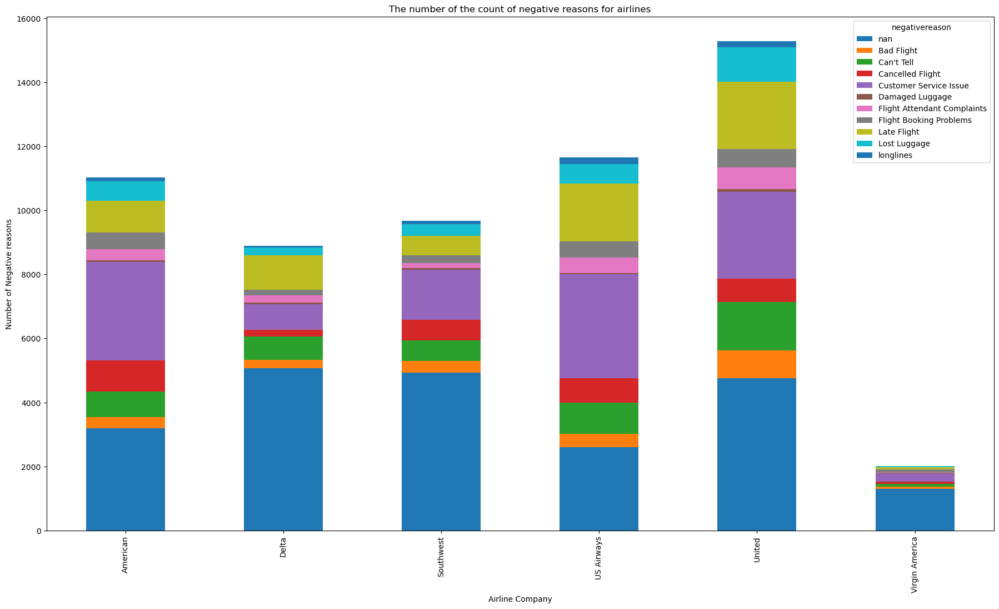

In [35]:
# MongoDB client
client = MongoClient('mongodb://localhost:27017/')

# Select your database and collection
db = client['mydatabase']
collection = db['mycollection']

# Aggregation pipeline
pipeline = [
    {'$group': {'_id': {'airline': '$airline', 'negativereason': '$negativereason'}, 'count': {'$sum': 1}}},
    {'$sort': {'count': -1}}
]

# Run aggregation
results = collection.aggregate(pipeline)

# Convert results to pandas DataFrame
df = pd.DataFrame(list(results))

# Extract airline and sentiment from '_id'
df['airline'] = df['_id'].apply(lambda x: x['airline'])
df['negativereason'] = df['_id'].apply(lambda x: x['negativereason'])

# Pivot DataFrame for stacked bar plot
pivot_df = df.pivot(index='airline', columns='negativereason', values='count')

# Plot stacked bar chart
pivot_df.plot(kind='bar', stacked=True, figsize=(22,12))
plt.xlabel('Airline Company')
plt.ylabel('Number of Negative reasons')
plt.title("The number of the count of negative reasons for airlines")
plt.show()


In [52]:
from pymongo import MongoClient
import pandas as pd
import nltk
from nltk.corpus import stopwords
import re
import string
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, precision_recall_curve, roc_curve, auc
from sklearn.model_selection import train_test_split, GridSearchCV
import matplotlib.pyplot as plt

# MongoDB client oluşturun
client = MongoClient('mongodb://localhost:27017/')

# Veritabanınızı ve koleksiyonunuzu seçin
db = client['mydatabase']
collection = db['mycollection']

# Veriyi çekin ve bir pandas DataFrame'ine dönüştürün
data = list(collection.find())
df = pd.DataFrame(data)

# Metin temizleme fonksiyonu
def clean_the_tweet(text):
    tokens = nltk.word_tokenize(re.sub("[^a-zA-Z]", " ", text))
    tokens = [token.lower() for token in tokens]
    return ' '.join(tokens[2:])

# Metin işleme fonksiyonu
def text_process(msg):
    nopunc = [char for char in msg if char not in string.punctuation]
    nopunc = ''.join(nopunc)
    return ' '.join([word for word in nopunc.split() if word.lower() not in stopwords.words('english')])

# Model skorlarını kontrol etme ve çizim yapma fonksiyonu
def check_scores(clf, X_train, X_test, y_train, y_test):
    model = clf.fit(X_train, y_train)
    predicted_class = model.predict(X_test)
    predicted_class_train = model.predict(X_train)
    test_probs = model.predict_proba(X_test)
    test_probs = test_probs[:, 1]
    yhat = model.predict(X_test)
    lr_precision, lr_recall, _ = precision_recall_curve(y_test, test_probs)
    lr_f1, lr_auc = f1_score(y_test, yhat), auc(lr_recall, lr_precision)

    print('Train confusion matrix is:')
    print(confusion_matrix(y_train, predicted_class_train))
    print()
    print('Test confusion matrix is:')
    print(confusion_matrix(y_test, predicted_class))
    print()
    print(classification_report(y_test, predicted_class))
    print()
    train_accuracy = accuracy_score(y_train, predicted_class_train)
    test_accuracy = accuracy_score(y_test, predicted_class)

    print("Train accuracy score:", train_accuracy)
    print("Test accuracy score:", test_accuracy)
    print()
    train_auc = roc_auc_score(y_train, clf.predict_proba(X_train)[:, 1])
    test_auc = roc_auc_score(y_test, clf.predict_proba(X_test)[:, 1])

    print("Train ROC-AUC score:", train_auc)
    print("Test ROC-AUC score:", test_auc)
    fig, (ax1, ax2) = plt.subplots(1, 2)

    ax1.plot(lr_recall, lr_precision)
    ax1.set(xlabel="Recall", ylabel="Precision")

    plt.subplots_adjust(left=0.5, bottom=0.1, right=1.5, top=0.9, wspace=0.4, hspace=0.4)
    print()
    print('Area under Precision-Recall curve:', lr_f1)

    fpr, tpr, _ = roc_curve(y_test, test_probs)
    ax2.set(xlabel='False Positive Rate', ylabel='True Positive Rate')


In [74]:
unique_sentiments = df['airline_sentiment'].unique()
print(unique_sentiments)


[1 0]


In [75]:
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

# NLTK'nın stop words listesini indirin
import nltk
nltk.download('stopwords')

# Porter Stemmer'ı oluşturun (isteğe bağlı)
stemmer = PorterStemmer()

# Stop words listesi
stop_words = set(stopwords.words('english'))

def clean_text(text):
    # Noktalama işaretlerini ve sayıları kaldır
    text = re.sub('[^a-zA-Z]', ' ', text)
    
    # Tüm metni küçük harfe çevir
    text = text.lower()
    
    # Metni kelimelere böl (tokenize)
    text = text.split()
    
    # Stop words'leri kaldır ve stemming yap
    text = [stemmer.stem(word) for word in text if not word in stop_words]
    
    # Kelimeleri birleştir ve sonucu döndür
    return ' '.join(text)

# 'cleaned_tweet' sütununu oluştur
df['cleaned_tweet'] = df['text'].apply(clean_text)

# TF-IDF vectorizer
vectorizer = TfidfVectorizer(use_idf=True, lowercase=True)
X_tf_idf = vectorizer.fit_transform(df.cleaned_tweet)
x_train, x_test, y_train, y_test = train_test_split(X_tf_idf, df['airline_sentiment'], random_state=42)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\dovle\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [76]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix

def check_scores(clf, X_train, X_test, y_train, y_test):
    model = clf.fit(X_train, y_train)

    # Predict classes
    predicted_class = model.predict(X_test)
    predicted_class_train = model.predict(X_train)

    # Accuracy scores
    train_accuracy = accuracy_score(y_train, predicted_class_train)
    test_accuracy = accuracy_score(y_test, predicted_class)

    # F1 scores
    train_f1 = f1_score(y_train, predicted_class_train, average='macro')
    test_f1 = f1_score(y_test, predicted_class, average='macro')

    # Confusion matrix for test data
    conf_matrix = confusion_matrix(y_test, predicted_class)

    print('Train Accuracy is:', train_accuracy)
    print('Test Accuracy is:', test_accuracy)

    print('Train F1 Score is:', train_f1)
    print('Test F1 Score is:', test_f1)

    print('Test Confusion Matrix:')
    print(conf_matrix)

    return train_accuracy, test_accuracy, train_f1, test_f1, conf_matrix

# Verilerinizi MongoDB'den DataFrame'e yükledikten sonra
# x_train, x_test, y_train, y_test şeklinde değişkenlerinizi oluşturduğunuzu varsayalım
clf = LogisticRegression()  # Kullanmak istediğiniz sınıflandırma modelini buraya yazın
check_scores(clf, x_train, x_test, y_train, y_test)


Train Accuracy is: 0.9578603818271092
Test Accuracy is: 0.9475781994627849
Train F1 Score is: 0.9318095387052905
Test F1 Score is: 0.9143562729149364
Test Confusion Matrix:
[[9062  128]
 [ 477 1874]]


(0.9578603818271092,
 0.9475781994627849,
 0.9318095387052905,
 0.9143562729149364,
 array([[9062,  128],
        [ 477, 1874]], dtype=int64))

In [17]:
from pymongo import MongoClient
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
import nltk
from nltk.corpus import stopwords
import re
from nltk.stem.porter import PorterStemmer

# MongoDB client oluşturun
client = MongoClient('mongodb://localhost:27017/')

# Veritabanınızı ve koleksiyonunuzu seçin
db = client['mydatabase']
collection = db['mycollection']

# Veriyi çekin ve bir pandas DataFrame'ine dönüştürün
data = list(collection.find())
df = pd.DataFrame(data)

# Metin temizleme fonksiyonu
def clean_text(text):
    # Noktalama işaretlerini ve sayıları kaldır
    text = re.sub('[^a-zA-Z]', ' ', text)
    
    # Tüm metni küçük harfe çevir
    text = text.lower()
    
    # Metni kelimelere böl (tokenize)
    text = text.split()
    
    # Stop words'leri kaldır ve stemming yap
    stop_words = set(stopwords.words('english'))
    stemmer = PorterStemmer()
    text = [stemmer.stem(word) for word in text if not word in stop_words]
    
    # Kelimeleri birleştir ve sonucu döndür
    return ' '.join(text)

# 'cleaned_tweet' sütununu oluştur
df['cleaned_tweet'] = df['text'].apply(clean_text)

# TF-IDF vectorizer
vectorizer = TfidfVectorizer(use_idf=True, lowercase=True)
X_tf_idf = vectorizer.fit_transform(df['cleaned_tweet'])
X_train, X_test, y_train, y_test = train_test_split(X_tf_idf, df['airline_sentiment'], test_size=0.2, random_state=42)
